# Data

> Nous disposons d'un ensemble de données de **17092** images de cellules normales du sang préphérique, les images sont 
réparties sur **8 classes** de types distincts à savoir : **'basophil'**, **'eosinophil'**, **'erythroblast'**, **'immature granulocytes'**, **'lymphocyte'**, **'monocyte'**, **'neutrophil'** et **'platelet'**.
Dans ce notebook on va effectuer un audit général de nos images avec quelques visualisations, et aussi de preprocessing sur images en appliquant des divers filtres.  
Voici un URL directe vers les données : **[Data](https://data.mendeley.com/datasets/snkd93bnjr/draft?a=d9582c71-9af0-4e59-9062-df30df05a121)**

# 1.1 Charger les données

In [1]:
import pandas as pd
import numpy as np
from termcolor import colored
import random
from datetime import datetime

import sys
import time
from tqdm import tqdm #pour barre de temps dans une boucle for
import glob
import os
import subprocess, re

import cv2 ## Package pour lire nos images
from PIL import Image ## Importer ce package pour pouvoir voir le format de l'image
import skimage.exposure

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.preprocessing import MinMaxScaler
from sklearn.svm import SVC 
from sklearn.metrics import classification_report

# 1.2. Accès aux paths personnalisées des datasets et dossiers d'analyses

In [4]:
try:
    # identifiant Windows
    import subprocess, re
    ide = re.findall(r'[A-Z0-9-]+-[A-Z0-9-]+',str(subprocess.check_output('wmic csproduct get uuid').strip()))[0]
except OSError:
    try:
        # identifiant Linux
        import pwd
        ide = pwd.getpwuid( os.getuid() ).pw_name
    except OSError:
        # identifiant Mac OS
        import uuid
        ide = hex(uuid.getnode())

local_var = pd.read_csv('path.csv',index_col=0)

if ide in local_var.index:
    username = local_var.loc[ide,'name']
    path_dataset = local_var.loc[ide,'path_dataset']
    path_analysis = local_var.loc[ide,'path_analysis']
    path_data_prep = local_var.loc[ide,'path_data_prep']
    path_models = local_var.loc[ide,'path_models']
    print(f'  Username: {username}\n'
         +f'  Dataset directory: {path_dataset}\n'
         +f'  Saved analysis: {path_analysis}\n'
         +f'  Data preprocessed directory: {path_data_prep}\n'
         +f'  Models directory: {path_models}')
else:
    print('Computer not recognized :\n'
         f'  Please enter your computer_id {ide} and the associated parameters in \path.csv')
    
## Chemin pour aller récupérer les images stocker dans le dossier 'PBC_dataset_normal_DIB'
path = path_dataset

  Username: Said
  Dataset directory: C:/Users/HP/Desktop/20211121_Projets Data Sciences/20211121-Projet_Deep Learning_Blood_Cell/2.Prepared Data/PBC_dataset_normal_DIB/
  Saved analysis: C:/Users/HP/Desktop/Projets Data Sciences/20211121-Projet_Deep Learning_Blood_Cell/5.Insights/
  Data preprocessed directory: nan
  Models directory: nan


# 1.3. Verification des fichiers RGB

In [3]:
import os
from PIL import Image
folder_path = path_dataset
extensions = []
for fldr in os.listdir(folder_path):
    sub_folder_path = os.path.join(folder_path, fldr)
    for filee in os.listdir(sub_folder_path):
        file_path = os.path.join(sub_folder_path, filee)
        print('** Path: {}  **'.format(file_path), end="\r", flush=True)
        im = Image.open(file_path)
        rgb_im = im.convert('RGB')
        if filee.split('.')[1] not in extensions:
            extensions.append(filee.split('.')[1])

# 2. Audit

In [5]:
## Créer une liste où stocker les noms de nos 8 différentes classes
Classes = []
for element in os.listdir(path):
    nom_classe = os.listdir(path+element)
    Classes.append(nom_classe)

In [5]:
# importer toutes les images des 8 différentes classes et les stocker dans un array images
"""Images = []
for element in os.listdir(path) :
    for img in glob.glob(path+element+'/'+'*.jpg'): 
        imge = cv2.imread(img)
        Images.append(imge)"""
##

## 2.1. Regarder la répartition de nos données sur les 8 classes 

In [7]:
# Afficher la taille de nos classes et le pourcentage de chacune d'entre elle dans un DataFrame
type_cellule=['basophil','eosinophil', 'erythroblast','immature granulocytes','lymphocyte','monocyte','neutrophil',
              'platelet']
Total_Number = []
Percentage = []
for i, Classe in zip(range(len(Classes)),type_cellule):
    Total_Number.append(len(Classes[i]))
    Percentage.append(round(len(Classes[i])/17092 *100,2))

dictionnaire = {'Type de Cellule': [i for i in type_cellule],
                'Total_images' : [j for j in Total_Number],
                '%' : [perc for perc in Percentage]
                 }

DF = pd.DataFrame(data = dictionnaire, columns=dictionnaire.keys())

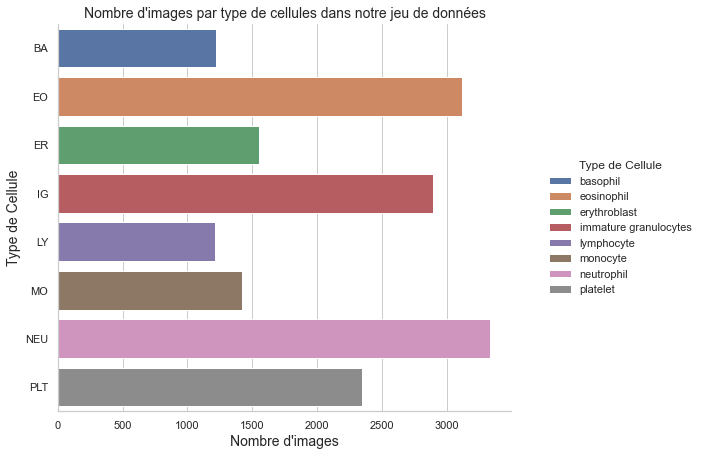

In [8]:
import seaborn as sns
sns.set_theme(style="whitegrid")

g = sns.catplot(y='Type de Cellule',x='Total_images',hue='Type de Cellule' ,data=DF,kind='bar',dodge=False,height=8)
g.fig.set_figwidth(12)
g.fig.set_figheight(6)
g.set_yticklabels(["BA", "EO", "ER","IG","LY","MO","NEU","PLT"])
plt.title("Nombre d'images par type de cellules dans notre jeu de données", size=14)
plt.xlabel("Nombre d'images",size=14)
plt.ylabel("Type de Cellule",size=14);

### i. Taille des images

In [9]:
## Vérifier une à une la taille des images ('hauteur, largeur et profondeur)
## en cas où on a des images qui n'ont pas la même taille que la plupart des images on va stocker dans une liste les noms 
## de ses images et ensuite nous allons les redimentionner.
h = 363 
w = 360
c = 3

img_other_size = []    
for element, Classe in zip(os.listdir(path),Classes) :
    for img, imge in zip(glob.glob(path+element+'/'+'*.jpg'), Classe) :
        if cv2.imread(img).shape != (h,w,c) :
            img_other_size.append(imge)

print("\n")

if not img_other_size :
    print(colored("Toutes nos images ont la même taille"),attrs=['bold'])
else :
    print(colored(len(img_other_size),attrs=['bold']),
          "images possèdent une taille différente de la taille des autres images !")




1 images possèdent une taille différente de la taille des autres images !


### ii. Format des images

In [10]:
## format de nos images
for element in os.listdir(path) :
    for img in glob.glob(path+element+'/'+'*.jpg'): 
        format_image = Image.open(img).format

print("le format de nos images est :", format_image)

# Si il y'a des images avec un format différent des autres images, on va les récupérer et ensuite les stocker dans la liste
# img_other_format        
img_other_format = []

for element, Classe in zip(os.listdir(path),Classes) :
    for img, imge in zip(glob.glob(path+element+'/'+'*.jpg'), Classe) : 
        if Image.open(img).format != 'JPEG' :
            img_other_format.append(imge)

#print("\n")

if not(img_other_format) :
    print(colored("toutes nos images ont le même format !",attrs=['bold']))
else :
    img_other_format

le format de nos images est : JPEG
toutes nos images ont le même format !


### iii. Resizer les images qui n'ont pas la bonne dimension

In [10]:
# # dimension de nos images
# height = 363
# width = 360
# dim = (width, height)

# # on redimensionne les images une à une et on écrase celles qui n'ont pas les bonnes dimensions
# for element in os.listdir(path) :
#     # print(element)
#     for i in range(len(img_other_size)) :
#         for j in glob.glob(path+element+'/'+img_other_size[i]): #'*.jpg'
#             img = cv2.imread(j,cv2.IMREAD_UNCHANGED)
#             # print(j,img.shape)
#             resized = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
#             cv2.imwrite(j,resized)
#             # print(type(resized))
           
           

## 2.2. Visualisation des différents classes de cellules

In [11]:
# Fonction pour récupérer k images de manière aléatoire
def RandomImage(k,noms_classes):
    '''
    la fonction RandomImage va nous permettre de récupérer un nombre d'images (k) de chaque classe de nos cellules
    de manière aléatoire, ensuite les stocker dans une liste img_random 
    
    paramètres :
    noms_classes : les noms de nos 8 classes de cellules sanguines
    k : le nombre d'images qu'on veut récupérer de chaques classe de notre data base
    '''
    img_random = []
    for i in range(len(noms_classes)) :
        for j in range(k):
            img = random.choice(noms_classes[i])
            img_random.append(img) 
    return img_random

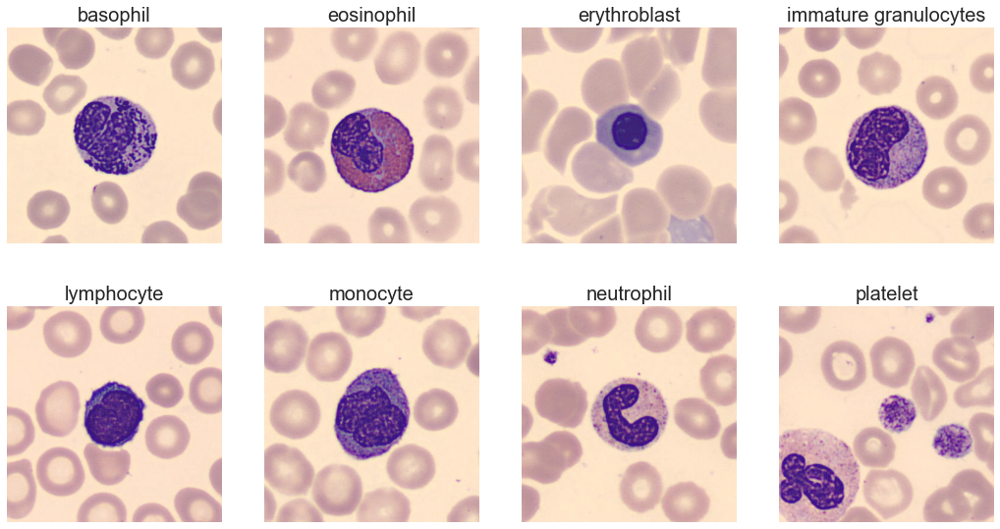

In [13]:
#------- Afficher pour chaque type de cellules une image, qu'on récupére du manière aléatoire ---------#
# selectionner une seule cellule de chaque type de classe et les visualiser avec plt.imshow
img_random = RandomImage(1,Classes)

noms_classe = ['basophil','eosinophil','erythroblast','immature granulocytes','lymphocyte','monocyte','neutrophil',
               'platelet']

sns.set_theme(style="white")
fig= plt.figure(figsize=(18,20))   
for i in range(len(img_random)):        
    # subplots
    plt.subplot(4, 4, i+1)   
    # Afficher l'image en couleur
    plt.axis('off')
    plt.imshow(cv2.cvtColor(cv2.imread(path+os.listdir(path)[i]+'/'+img_random[i],cv2.IMREAD_COLOR),cv2.COLOR_BGR2RGB));
    
    # set the title to subplots
    plt.gca().set_title(noms_classe[i],size=20) ;
    

> D'après les résultas ci-dessus ce que nous pouvons dire c'est qu'il n'y a pas vraiment des différences significatives entre les cellules, ce qui est normale puisque elles sont toutes des cellules sanguines. 

# 3. Preprocessing

## 3.1. Distributions des couleurs et la balance des blancs 

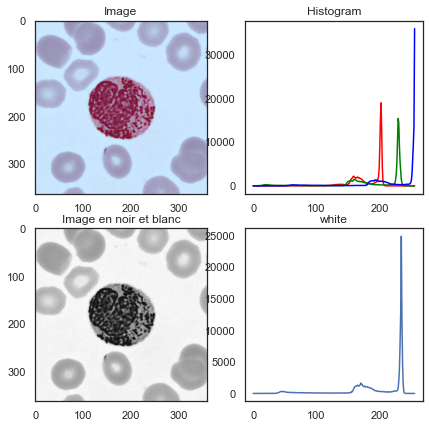

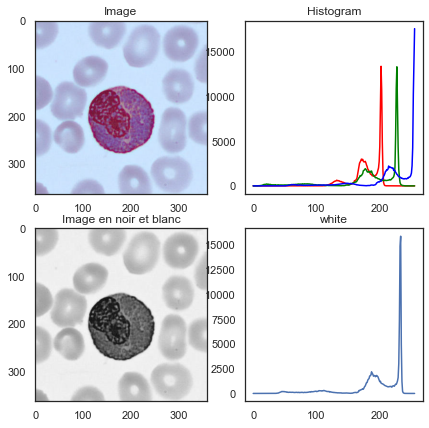

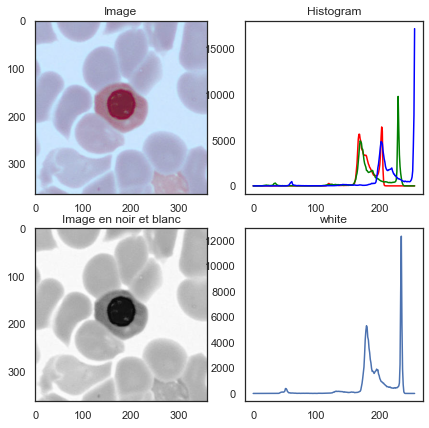

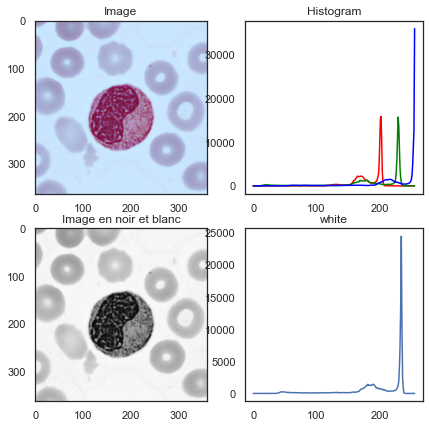

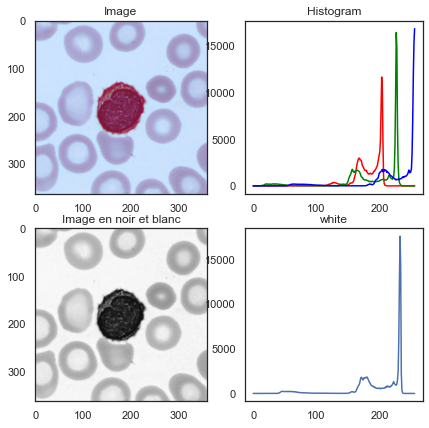

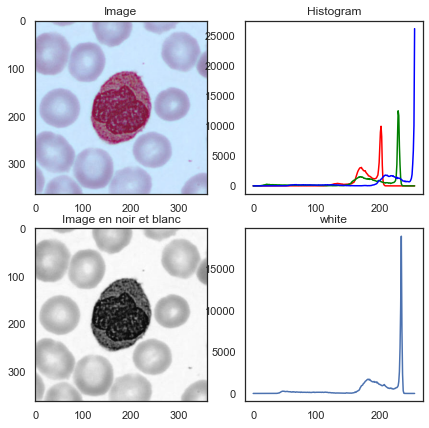

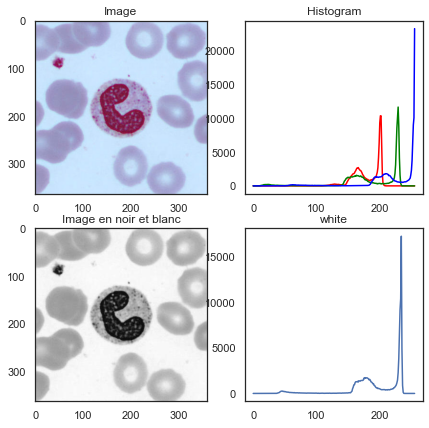

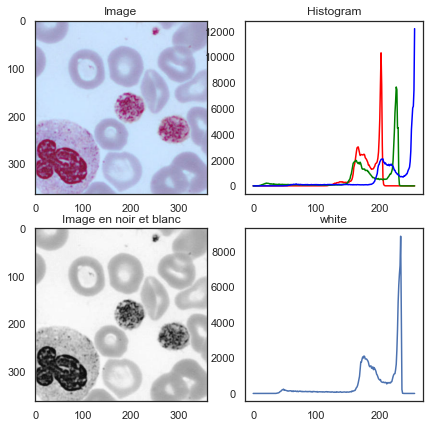

In [18]:
# Fonction pour tracer l'histogramme des couleurs
def histogramOpenCV(img_co, img_gr, white_hi):
    _, axis = plt.subplots(nrows=2, ncols=2, figsize=(7, 7))
    axis[0][0].imshow(img_co)
    axis[0][1].set_title('Histogram')
    axis[0][0].set_title('Image')
    rgbcolors = ['red', 'green', 'blue']
    for i,col in enumerate(rgbcolors):
        histr = cv2.calcHist([img_co],[i],None,[256],[0,256])
        axis[0][1].plot(histr,color = col)
        axis[1][0].imshow(img_gr,'gray')
    axis[1][0].set_title("Image en noir et blanc")
    axis[1][1].plot(white_hi)
    axis[1][1].set_title("white")
        
#Lecture des images en mode noir et blanc ou couleurs
#transformation de l'image couleur en noir et blanc

# Créer des listes vides pour stocker les différentes lectures de nos images noir et blanc, couleur 
Img_gray = [] 
Img_color = [] 
White_hist = []

for i in range(len(Classes)) :
    
    img = path+os.listdir(path)[i]+'/'+img_random[i]
        
    img_gray = cv2.imread(img, cv2.IMREAD_GRAYSCALE)  # str(img)
    Img_gray.append(img_gray)
    
    img_color = cv2.imread(img, cv2.IMREAD_COLOR)  # # str(img)
    Img_color.append(img_color)
    
    img_gray2 = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
    
    #histogramme en noir et blanc
    white_hist = cv2.calcHist([img_gray2],[0],None,[256],[0,256])
    White_hist.append(white_hist)

# Affichage des images
for i in range (len(img_random)):
    histogramOpenCV(Img_color[i], Img_gray[i], White_hist[i])


# Histogramme Moyen de la distribution des couleurs RGB des différentes classes de cellules

8it [02:27, 18.43s/it]


Time elapsed to preprocess: 2.0min 27.0sec


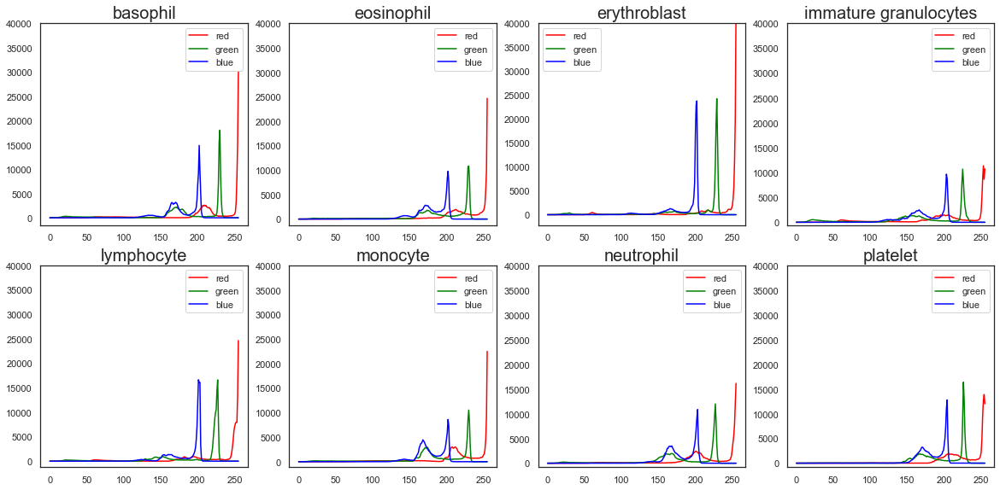

In [21]:
plt.figure(figsize=(20,20))

start = time.time()
 
for j,dossiers in tqdm(enumerate(os.listdir(path))): 
    # print(type(dossier))
    # print(dossiers)
    dossier = os.path.join(path+dossiers)
    # print(dossier)
    # rgbcolors = ['red']
    rgbcolors = ['red', 'green', 'blue']
    HISTR_COLOR= [[],[],[]]
    for i,col in enumerate(rgbcolors):
        # print(i, col)
        for image in os.listdir(dossier): 
            image_path = os.path.join(dossier+"/"+image)
            # print(image_path)
            img_BGR = cv2.imread(image_path) 
            img_RGB = cv2.cvtColor(img_BGR, cv2.COLOR_BGR2RGB)
            histr_color = cv2.calcHist([img_RGB],[i],None,[256],[0,256])
        HISTR_COLOR[i].append(histr_color)                                    # creation d'une liste contenant tous les histogrammes/dossier
        HISTR_COLOR[i]= np.concatenate(HISTR_COLOR[i], axis=1)                #concatenation des arrays histo en colonnes (1 col/256 lignes)
        HISTR_COLOR[i]= np.mean(HISTR_COLOR[i], axis=1)                       #Moyennage de l'array conconténée
    plt.subplot(4,4,j+1)
    plt.plot(HISTR_COLOR[0],color = rgbcolors[0], label = rgbcolors[0])
    plt.plot(HISTR_COLOR[1],color = rgbcolors[1], label = rgbcolors[1])  
    plt.plot(HISTR_COLOR[2],color = rgbcolors[2], label = rgbcolors[2])  
    plt.title(dossiers, fontsize=20)
    plt.legend()
    plt.ylim(top=40000)
    
#plt.savefig(path_analysis +'hist_moyen_RGB_classes.jpg')

end = time.time()
elapsed = end - start
print(f'Time elapsed to preprocess: {elapsed//60}min {round(elapsed % 60,0)}sec')
     

# Histogramme Moyen de la distribution des noirs et blancs des différentes classes de cellules

basophil
eosinophil
erythroblast
ig
lymphocyte
monocyte
neutrophil
platelet


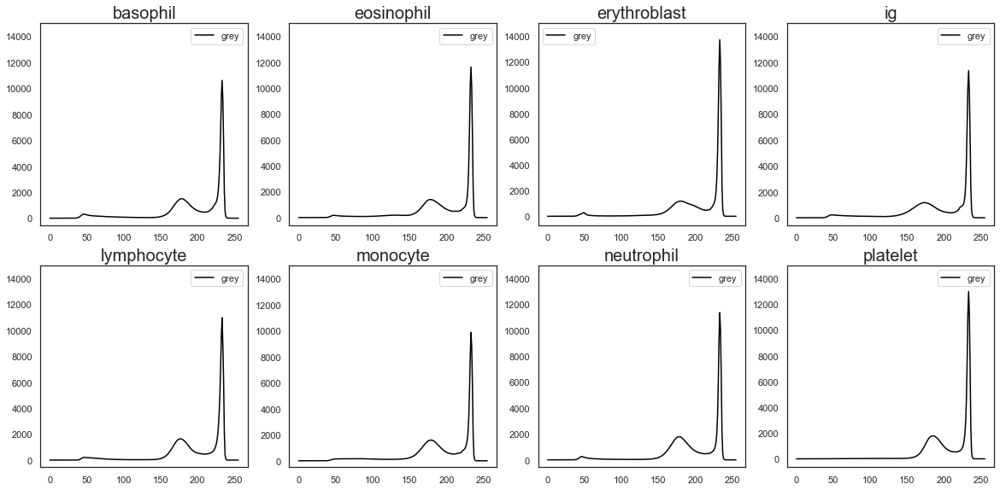

In [15]:
plt.figure(figsize=(20,20))
for j,dossiers in enumerate(os.listdir(path)): 
    # print(type(dossier))
    #print(dossiers)
    dossier = os.path.join(path+dossiers)
    # print(dossier)
    HISTR_GREY = []
    for image in os.listdir(dossier): 
        # (print(image))
        image_path = os.path.join(dossier+"/"+image)
        img_grey = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE) 
        histr_grey = cv2.calcHist([img_grey],[0],None,[256],[0,256])
        # print(histr_grey.dtype, type(histr_grey))
        HISTR_GREY.append(histr_grey)          
    HISTR_GREY= np.concatenate(HISTR_GREY, axis=1)
    HISTR_GREY= np.mean(HISTR_GREY, axis=1)
    plt.subplot(4,4,j+1)
    plt.plot(HISTR_GREY, color = "black")
    plt.ylim(top=15000)
    plt.title(dossiers, fontsize=20)
    plt.legend(["grey"])
    plt.savefig(path_analysis + 'hist_moyen_grey_classes.jpg')
 


## 3.2. Transformation de l'image de RGB => HSV

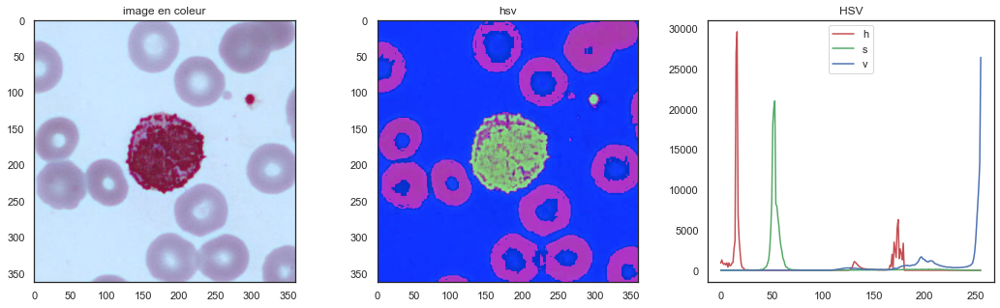

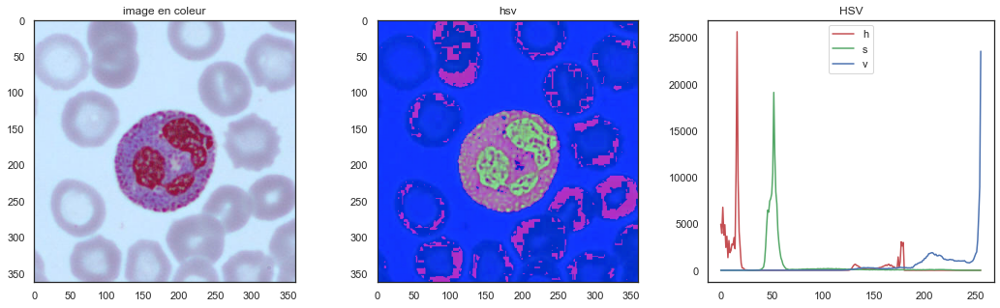

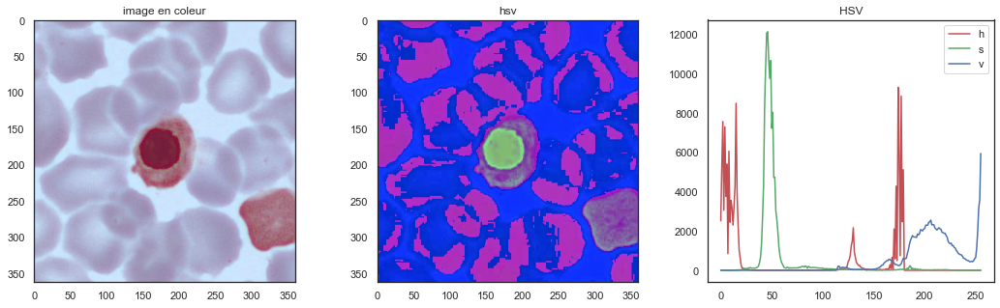

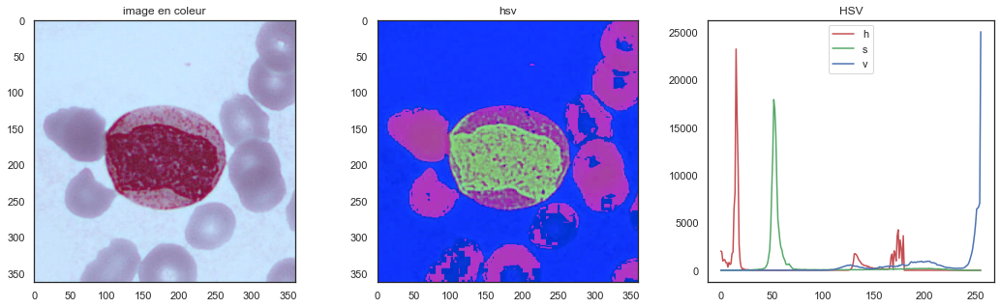

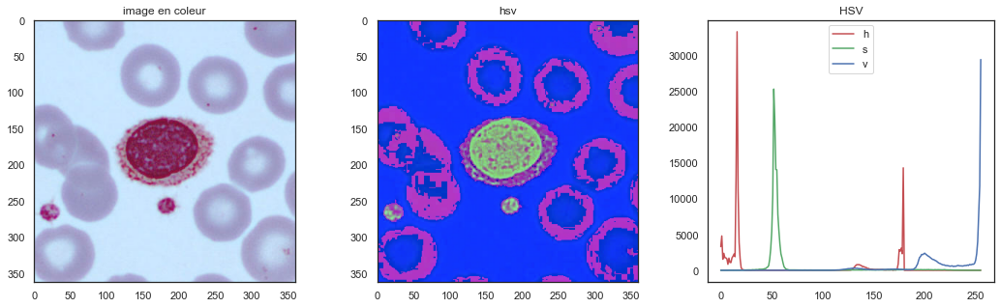

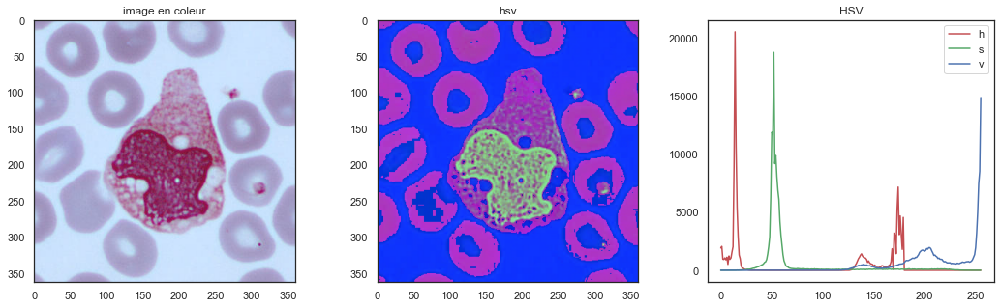

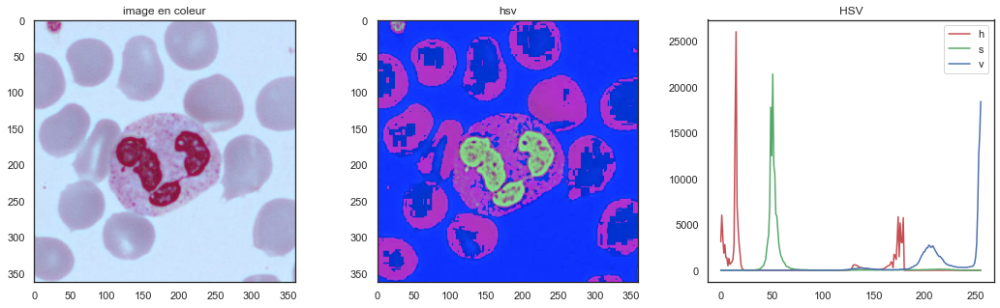

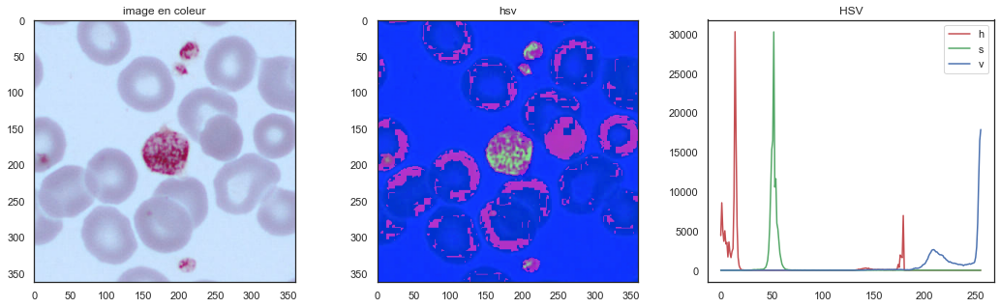

In [16]:
Hsv = [] 

#Déclaration des couleurs des courbes
color = ('r','g','b')
#Déclaration des noms des courbes.
labels = ('h','s','v')

for j in range(len(img_random)) :   
    img = path+os.listdir(path)[j]+'/'+img_random[j]
    hsv = cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2HSV)
    Hsv.append(hsv)
    
for j in range(len(img_random)) :
    _, axis = plt.subplots(ncols=3, figsize=(18, 5))
    for i,col in enumerate(color):
        #Hist prend la valeur de l'histogramme de hsv sur la canal i.
        hist_hsv = cv2.calcHist([Hsv[j]],[i],None,[256],[0,256])

        # Plot de hist.
        #plt.subplot(223),
        axis[2].plot(hist_hsv,color = col,label=labels[i])
        axis[2].set_title('HSV')
        axis[2].legend()
        #axis[2].xlim([0,256])

    axis[0].imshow(Img_color[j], 'gray')
    axis[0].set_title("image en coleur")
    axis[1].imshow(Hsv[j], 'gray')
    axis[1].set_title('hsv');


# Histogramme Moyen de la distribution des couleurs HSV des différentes classes de cellules

8it [01:18,  9.85s/it]


Time elapsed to preprocess: 1.0min 19.0sec


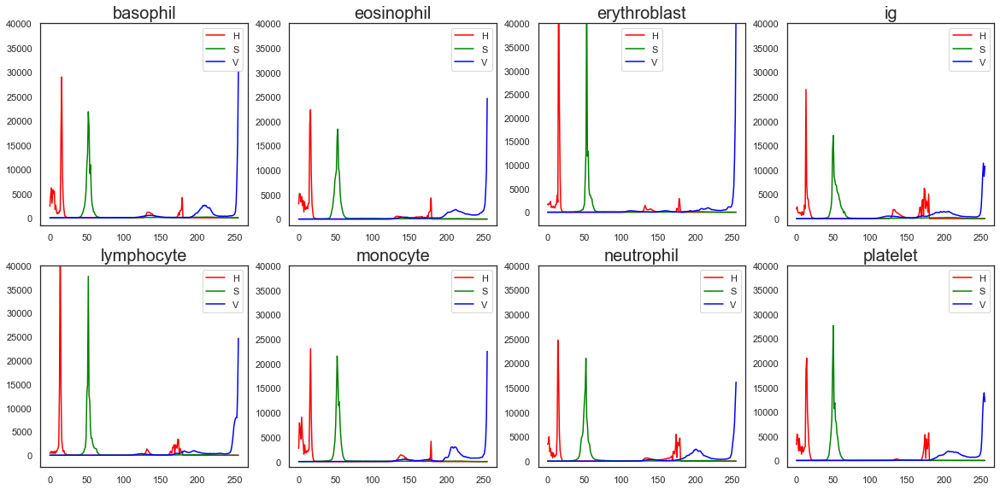

In [17]:
plt.figure(figsize=(20,20))

start = time.time()
 
for j,dossiers in tqdm(enumerate(os.listdir(path))): 
    # print(type(dossier))
    # print(dossiers)
    dossier = os.path.join(path+dossiers)
    # print(dossier)
    # rgbcolors = ['red']
    hsvcolors = ['H', 'S', 'V']
    HISTR_HSV= [[],[],[]]
    for i,col in enumerate(rgbcolors):
        # print(i, col)
        for image in os.listdir(dossier): 
            image_path = os.path.join(dossier+"/"+image)
            img_color = cv2.imread(image_path) 
            hsv = cv2.cvtColor(img_color, cv2.COLOR_BGR2HSV)
            histr_hsv = cv2.calcHist([hsv],[i],None,[256],[0,256])
        HISTR_HSV[i].append(histr_hsv)                                      # creation d'une liste contenant tous les histogrammes/dossier
        HISTR_HSV[i]= np.concatenate(HISTR_HSV[i], axis=1)                  #concatenation des arrays histo en colonnes (1 col/256 lignes)
        HISTR_HSV[i]= np.mean(HISTR_HSV[i], axis=1)                         #Moyennage de l'array conconténée
    
    graph_colors = ['red', 'green', 'blue']
    plt.subplot(4,4,j+1)
    plt.plot(HISTR_HSV[0],color = graph_colors[0], label = hsvcolors[0])
    plt.plot(HISTR_HSV[1],color = graph_colors[1], label = hsvcolors[1])  
    plt.plot(HISTR_HSV[2],color = graph_colors[2], label = hsvcolors[2])  
    plt.title(dossiers, fontsize=20)
    plt.legend()
    plt.ylim(top=40000)
    
    # print(dossiers, 'processed.')
    
plt.savefig(path_analysis +'hist_moyen_HSV_classes.jpg')

end = time.time()
elapsed = end - start
print(f'Time elapsed to preprocess: {elapsed//60}min {round(elapsed % 60,0)}sec')

## 3.2. Transformation de l'image de RGB => LAB


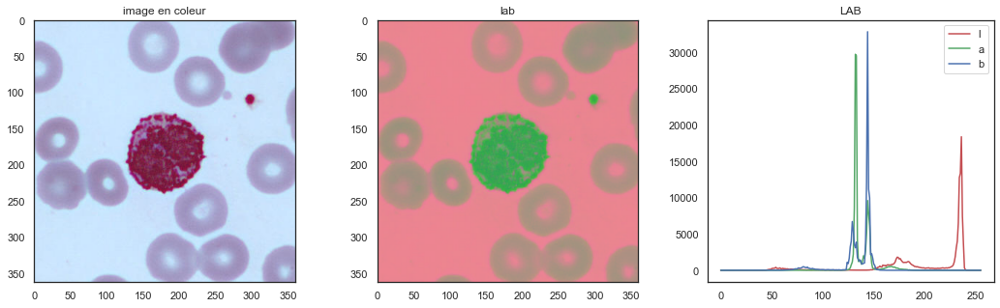

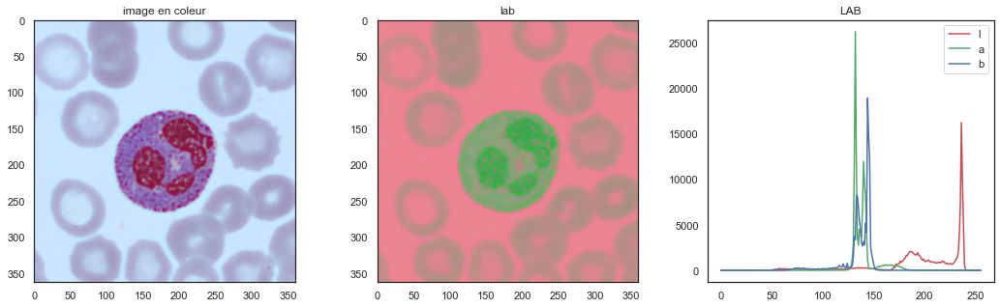

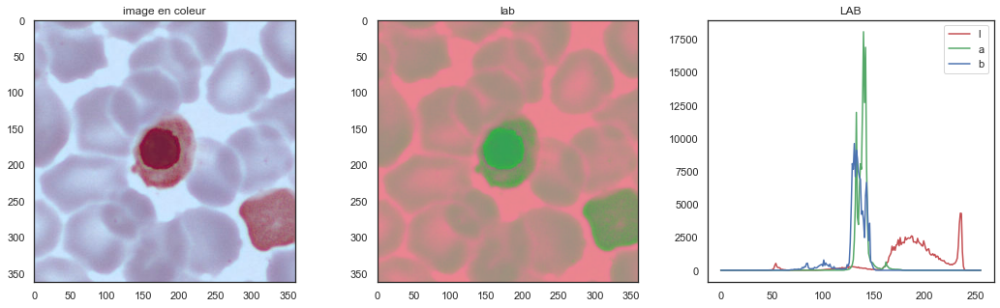

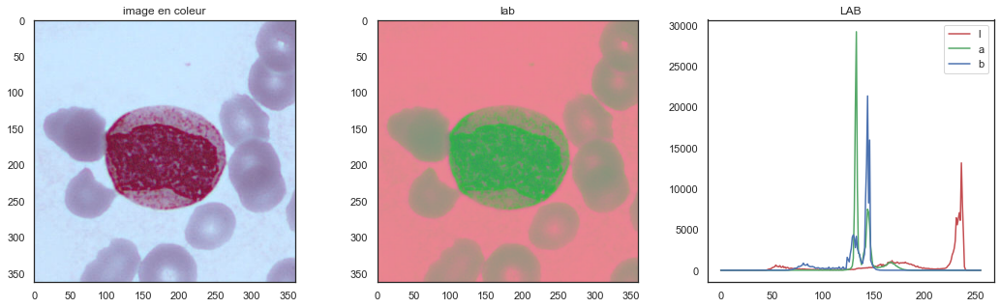

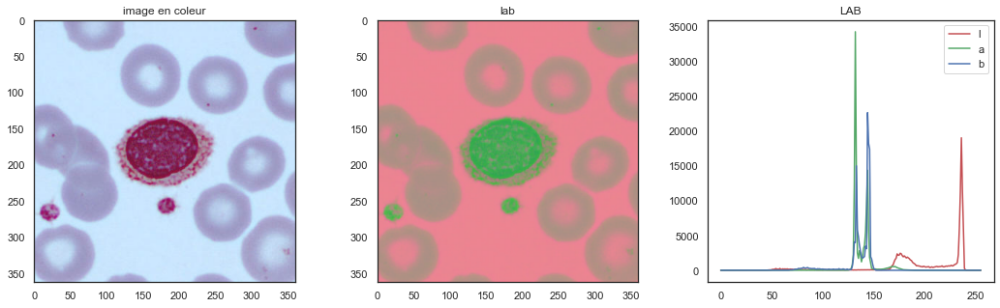

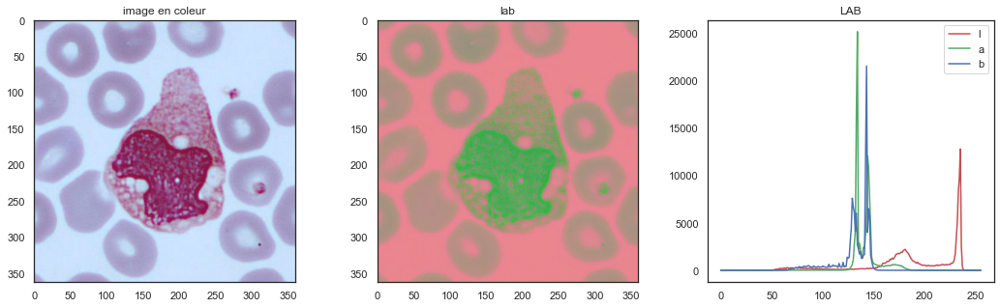

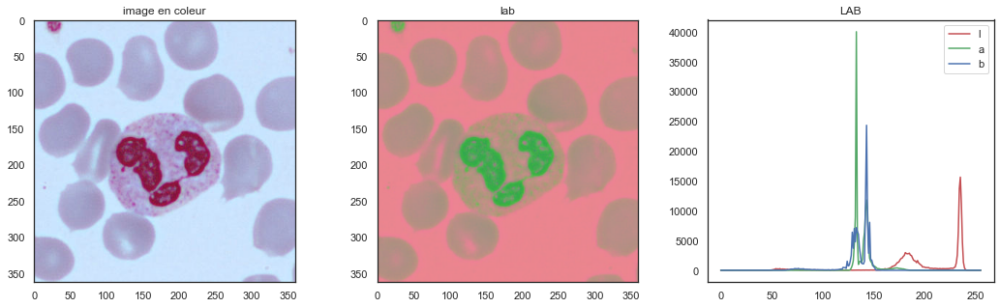

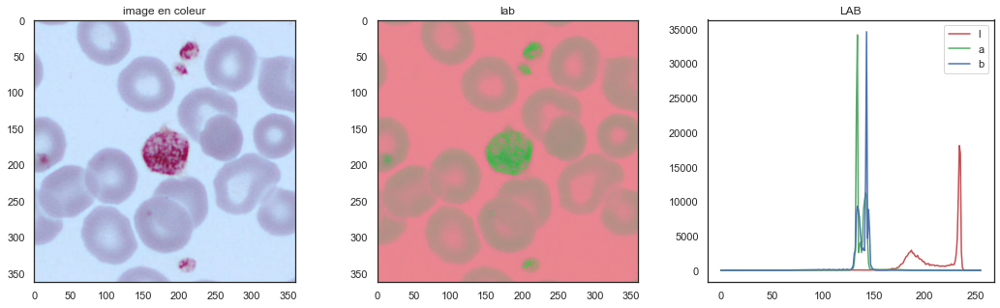

In [18]:
Lab = []

#Déclaration des couleurs des courbes
color = ('r','g','b')
#Déclaration des noms des courbes.
labels = ('l','a','b')
for j in range(len(img_random)) :   
    img = path+os.listdir(path)[j]+'/'+img_random[j]
    lab = cv2.cvtColor(cv2.imread(img), cv2.COLOR_BGR2LAB)
    Lab.append(lab)
    
for j in range(len(img_random)) :
    _, axis = plt.subplots(ncols=3, figsize=(18, 5))
    for i,col in enumerate(color):
        #Hist prend la valeur de l'histogramme de hsv sur la canal i.
        hist_lab = cv2.calcHist([Lab[j]],[i],None,[256],[0,256])

        axis[2].plot(hist_lab,color = col,label=labels[i])
        axis[2].set_title('LAB')
        axis[2].legend()

    axis[0].imshow(Img_color[j], 'gray')
    axis[0].set_title("image en coleur")
    axis[1].imshow(Lab[j], 'gray')
    axis[1].set_title('lab');


# Histogramme Moyen de la distribution des couleurs LAB des différentes classes de cellules

basophil
eosinophil
erythroblast
ig
lymphocyte
monocyte
neutrophil
platelet


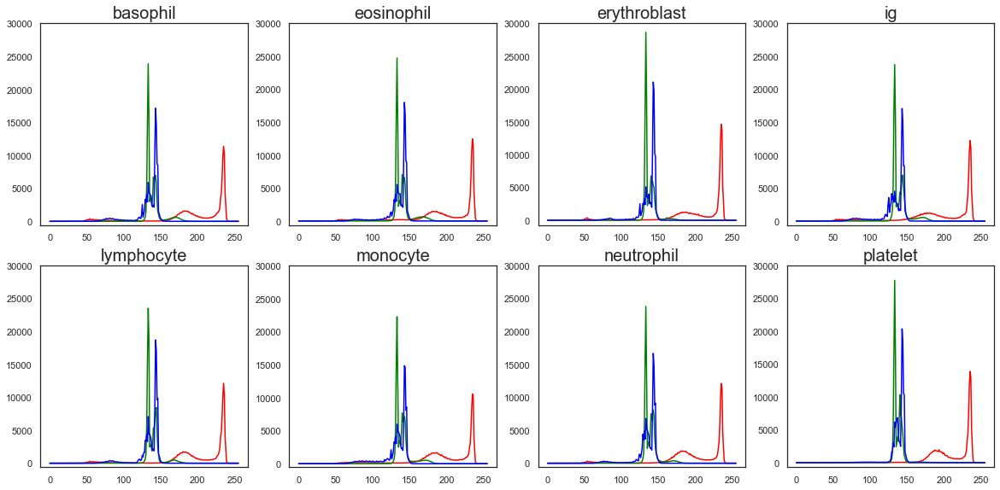

In [20]:
plt.figure(figsize=(20,20))    
for j,dossiers in enumerate(os.listdir(path)): 
    # print(type(dossier))
    #print(dossiers)
    dossier = os.path.join(path+dossiers)
    # print(dossier)
    # rgbcolors = ['green']
    # plt.subplot(4,4,i)
    rgbcolors = ['red', 'green', 'blue']
    for i,col in enumerate(rgbcolors):
        # print(i, col)
        HISTR_LAB = []
        for image in os.listdir(dossier): 
            image_path = os.path.join(dossier+"/"+image)
            # print(image_path)
            img = cv2.imread(image_path)
            lab = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
            histr_lab = cv2.calcHist([lab],[i],None,[256],[0,256])
            HISTR_LAB.append(histr_lab)          
        HISTR_LAB= np.concatenate(HISTR_LAB, axis=1)
        # HISTR_COLOR_MEAN.append(np.mean(HISTR_COLOR, axis=1)
        HISTR_LAB= np.mean(HISTR_LAB, axis=1)
        plt.subplot(4,4,j+1)
        plt.plot(HISTR_LAB,color = col)
        plt.title(dossiers, fontsize=20)
        plt.ylim(top=30000)
        plt.savefig(path_analysis +'hist_moyen_LAB_classes.jpg')


## 3.3. Etude des contours 

###  Méthode Canny

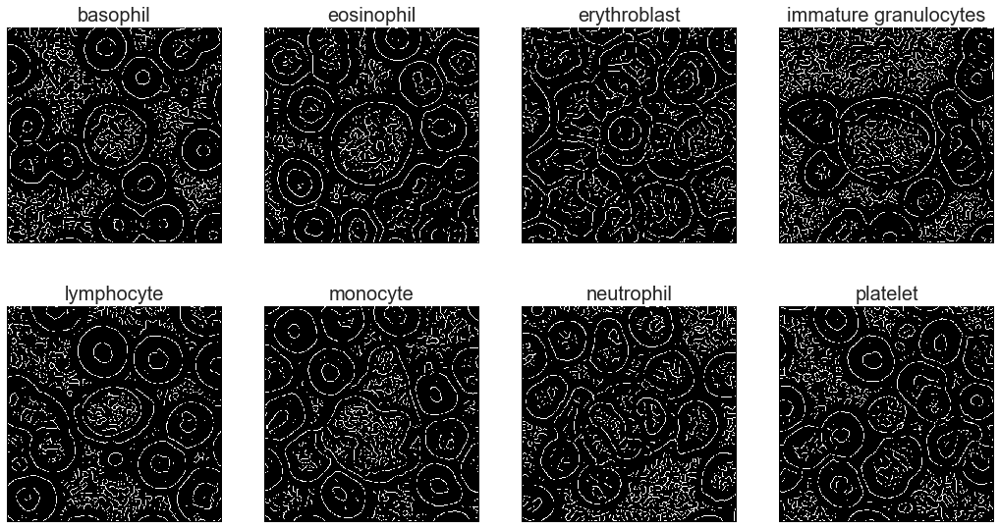



IMPACT DE LA VARIATION DU SIGMA DU FILTRE CANNY:




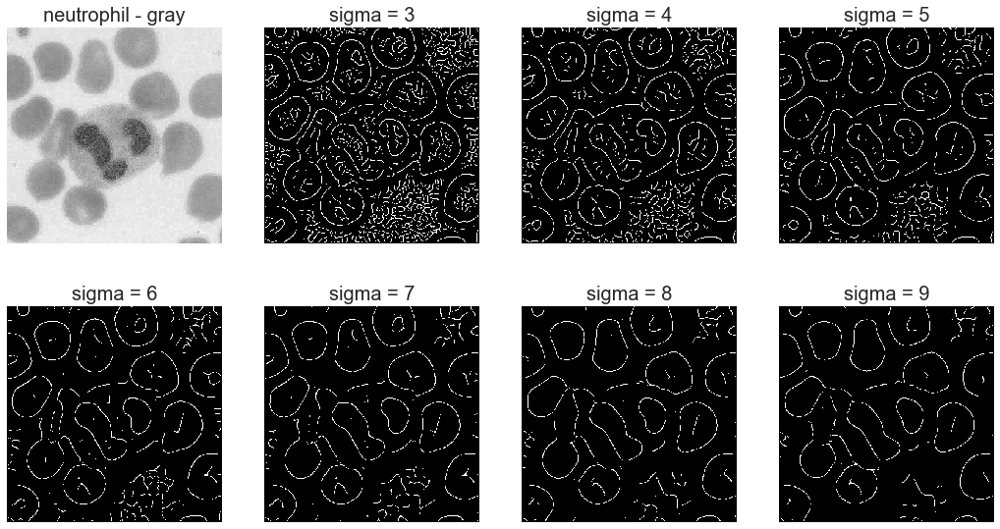

In [55]:
from skimage import feature

# Lire les images afficher la dessus 
imge_array = []
M = []
for i in range(len(img_random)) :
    imge = cv2.imread(path+os.listdir(path)[i]+'/'+img_random[i],cv2.IMREAD_COLOR)#,cv2.IMREAD_COLOR)
    m = np.zeros((imge.shape[0],imge.shape[1]))
    m[:,:] = imge[:,:,0]
    imge_array.append(imge)
    M.append(m)

#---------- Appliquer le filtre Canny  ----------#

edges = []
for i in range(len(imge_array)):
    edges.append(feature.canny(M[i], sigma=3)) # On peut jouer sur les valeurs de sigma  

fig = plt.figure(figsize=(18,20))   
for i in range(len(imge_array)) :        
    # subplots
    plt.subplot(4, 4, i+1)   
    # Afficher l'image
    plt.imshow(edges[i], cmap=plt.cm.gray, interpolation='nearest')
    # set the title to subplots
    plt.gca().set_title(noms_classe[i],size=20) 
    plt.axis('off')
plt.show()
    

# Rajouter une boucle pour faire varier le sigma (neutrophil)
# faire un filtre canny sur les sorties LAB et HSV

print('\n\nIMPACT DE LA VARIATION DU SIGMA DU FILTRE CANNY:\n\n')

i=6 # selectionne le type de cellule
type_cellule = noms_classe[i]
img_cellule = M[i]

Sigmas = range(3,3+7)
fig = plt.figure(figsize=(18,20))   
plt.subplot(4, 4, 1)
plt.imshow(img_cellule, cmap=plt.cm.gray, interpolation='nearest')
plt.gca().set_title(type_cellule + ' - gray',size=20)
plt.axis('off')
k=2
for sigma in Sigmas :        
    # subplots
    plt.subplot(4, 4, k)   
    # Afficher l'image
    plt.imshow(feature.canny(img_cellule, sigma=sigma), cmap=plt.cm.gray, interpolation='nearest')
    # set the title to subplots
    plt.gca().set_title(f'sigma = {sigma}',size=20)
    plt.axis('off')
    k+=1
plt.show()

## 3.4. Histogramme des pixels et filtre non local means

> Nous allons transformer l'image dans différents codages couleurs, nous utilisrons un codage couleurs YUV. On choisit ce format parce que il permet une meilleure visualisation pour l'histogramme. Après ça on égalisera notre image c'est à dire on va améliorer le contraste. Et la dernière chose qu'on va faire à cette image égaliser c'est d'appliquer un filtre non local means pour pallier le bruit qui peut être présent dans l'image. 

In [23]:
# Créer l'histogramme de l'image
def plot_histogram(init_img, convert_img):
    """Fonction permettant d'afficher les images initiales et converties selon un certain format colorimétrique ainsi que 
       l'histogramme de ces dernières. ainsi que l'histogramme de ces dernières.  

    Paramètres
    -------------------------------------------
    init_img : list
        init_img[0] = titre de l'image originale
        init_img[1] = l'image orginale
    convert_img : list
        convert_img[0] = titre de l'image convertis
        convert_img[1] = l'image convertis 
    -------------------------------------------
    """
    hist, bins = np.histogram(
                    convert_img[1].flatten(),
                    256, [0,256])
    # Cumulative Distribution Function
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()

    # Plot histogram
    fig = plt.figure(figsize=(25,6))
    plt.subplot(1, 3, 1)
    plt.imshow(init_img[1])
    plt.title("{} Image".format(init_img[0]), 
              color="#343434")
    plt.subplot(1, 3, 2)
    plt.imshow(convert_img[1])
    plt.title("{} Image".format(convert_img[0]), 
              color="#343434")
    plt.subplot(1, 3, 3)
    plt.plot(cdf_normalized, 
             color='r', alpha=.7,
             linestyle='--')
    plt.hist(convert_img[1].flatten(),256,[0,256])
    plt.xlim([0,256])
    plt.legend(('cdf','histogramme'), loc = 'upper left')
    plt.title("Histogramme de l'image convertis", color="#343434")
    plt.suptitle("Histogramme et la distribution cumulative pour l'image test cumulative",
              color="black", fontsize=22, y=.98)
    plt.show()

In [ ]:
# Tester sur une image
img_RGB = cv2.cvtColor(cv2.imread(path+os.listdir(path)[1]+'/'+img_random[1]), cv2.COLOR_BGR2RGB)
img_grayscale = cv2.cvtColor(cv2.imread(path+os.listdir(path)[1]+'/'+img_random[1]), cv2.COLOR_RGB2GRAY)
img_YUV = cv2.cvtColor(cv2.imread(path+os.listdir(path)[1]+'/'+img_random[1]),cv2.COLOR_BGR2YUV)
plot_histogram(["RGB", img_RGB], ["YUV", img_YUV])

In [ ]:
# Egalisation de l'image
img_YUV[:,:,0] = cv2.equalizeHist(img_YUV[:,:,0])
img_equ = cv2.cvtColor(img_YUV, cv2.COLOR_YUV2RGB)
plot_histogram(["RGB", img_RGB], ["Equalized", img_equ])

> **Application d'un filtre non local means sur une image test**

In [ ]:
dst_img = cv2.fastNlMeansDenoisingColored(
    src=img_equ,
    dst=None,
    h=10,
    hColor=10,
    templateWindowSize=7,
    searchWindowSize=21)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_equ)
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(dst_img)
plt.title("Filtered Image")
plt.suptitle("Non-local Means Filter",
             color="black", 
             fontsize=18, y=.98)
plt.show()

# 4. Nettoyage du Background

## Filtrage du Background en blanc 

In [24]:
def RemoveBackground(img):
    """
    Cette fonction permis de nettoyer le background d'une image originale, elle procède comme suite au départ on éffectue un 
    GaussianBlur et en esnuite un threshold avec les résultat de threshold on crée un mask avec morphologyEx, qu'on appliquera 
    à notre image. 
    
    paramètre :: 
    img : notre image original 
    
    """
    #start = time.time()
    
    l = int(max(12,13))
    u = int(max(13,13))
     
    edges = cv2.GaussianBlur(img, (5, 5), 3) # (21, 51), 3
    edges = cv2.cvtColor(edges, cv2.COLOR_BGR2GRAY)
    edges = cv2.Canny(edges, l, u)
    
    _, thresh = cv2.threshold(edges, 0, 255, cv2.THRESH_BINARY  + cv2.THRESH_OTSU)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5)) #(5, 5)
    mask = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel, iterations=4)
    
    data = mask.tolist()
    sys.setrecursionlimit(10**8) #(10**8)
    for i in  range(len(data)):
        for j in  range(len(data[i])):
            if data[i][j] !=  255:
                data[i][j] =  -1
            else:
                break
        for j in  range(len(data[i])-1, -1, -1):
            if data[i][j] !=  255:
                data[i][j] =  -1
            else:
                break
    image = np.array(data)
    image[image !=  -1] =  255
    image[image ==  -1] =  0

    mask = np.array(image, np.uint8)

    img_cleaned = cv2.bitwise_and(original, original, mask=mask)
    img_cleaned[mask ==  0] =  255
    
    
    #end = time.time()
    #elapsed_time = end - start
    
    return img_cleaned #, elapsed_time

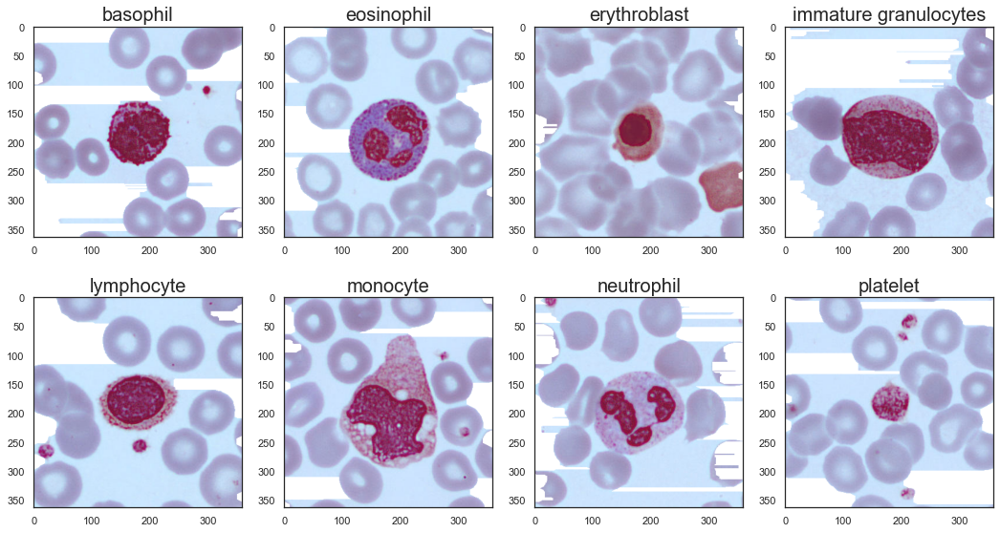

In [25]:
Img_cleaned = []

for i in range(len(img_random)):
    img = cv2.imread(path+os.listdir(path)[i]+'/'+img_random[i])
    original = img

    img_cleaned = RemoveBackground(img)
    Img_cleaned.append(img_cleaned)
    
noms_classe = ['basophil','eosinophil','erythroblast','immature granulocytes','lymphocyte','monocyte','neutrophil',
               'platelet']

fig= plt.figure(figsize=(18,20))   
for i in range(len(img_random)):        
    # subplots
    plt.subplot(4, 4, i+1)   
    # Afficher l'image
    plt.imshow(Img_cleaned[i])
    # set the title to subplots
    plt.gca().set_title(noms_classe[i],size=20) ; 


> **La méthode de nettoyage de background en utilisant " cv2.getStructuringElement " et " cv2.morphologyEx ", ne marche pas bien sur nos images !!**

##  Filtrage du background par couleur

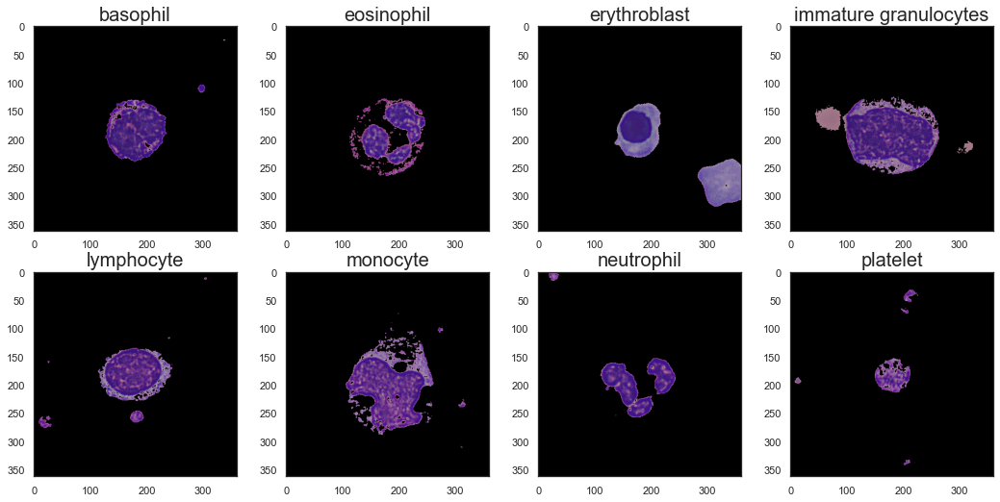

In [26]:
# Filtrage du background par couleur
figure = plt.figure(figsize=(18,18)) 

filtered_image = []
for i in range(len(img_random)):
    img = cv2.imread(path+os.listdir(path)[i]+'/'+img_random[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # on peut le faire en HSV et en LAB
    lower_color = np.array([30, 0, 0])
    upper_color = np.array([165,255,255])
    mask_color = cv2.inRange(img, lower_color, upper_color)
    res_red = cv2.bitwise_and(img,img, mask= mask_color)
    plt.subplot(4,4,i+1)
    plt.imshow(res_red);
    plt.gca().set_title(noms_classe[i],size=20)
    filtered_image.append(res_red)


> **Cette méthode donne des résultats beaucoup mieux que la précédente, on arrive à bien resortir la cellule qui nous interesse.**

# 5. Seuillage d'OTSU

## 5.1 Seuillage d'OTSU sur les images HSV

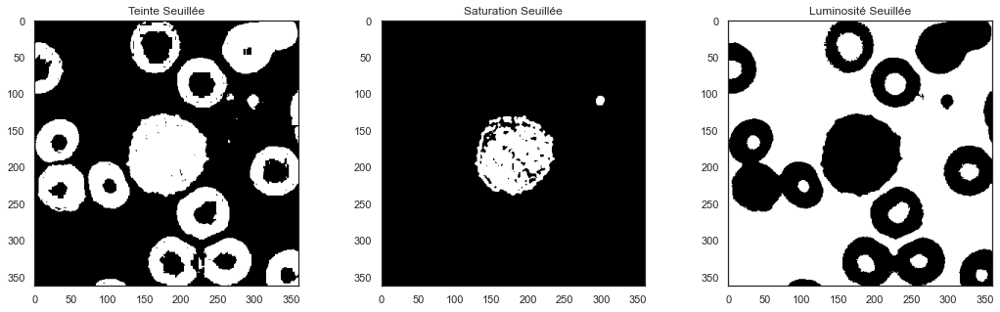

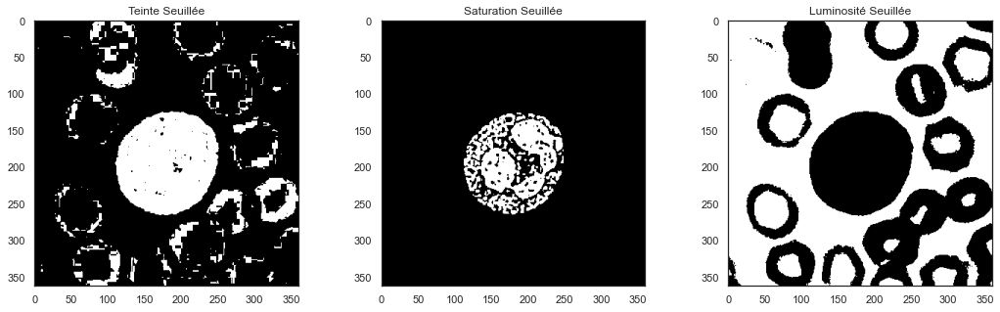

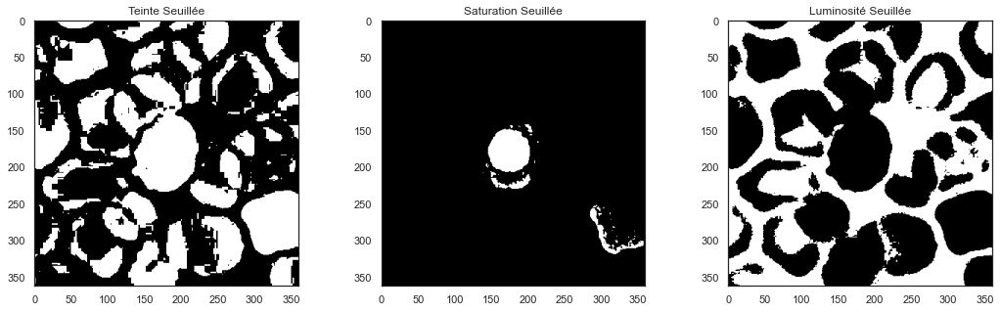

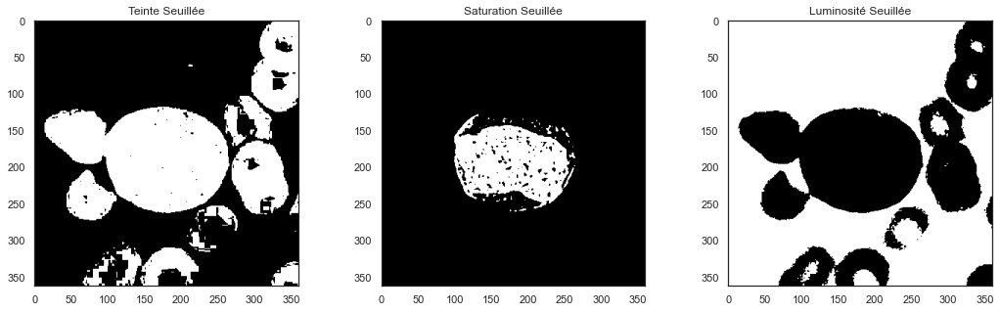

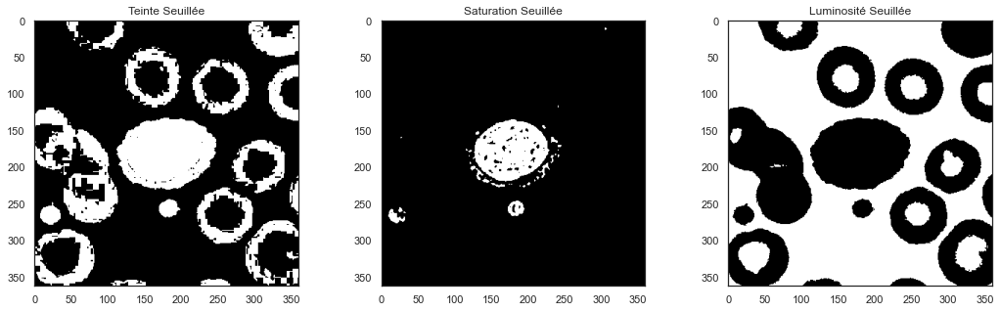

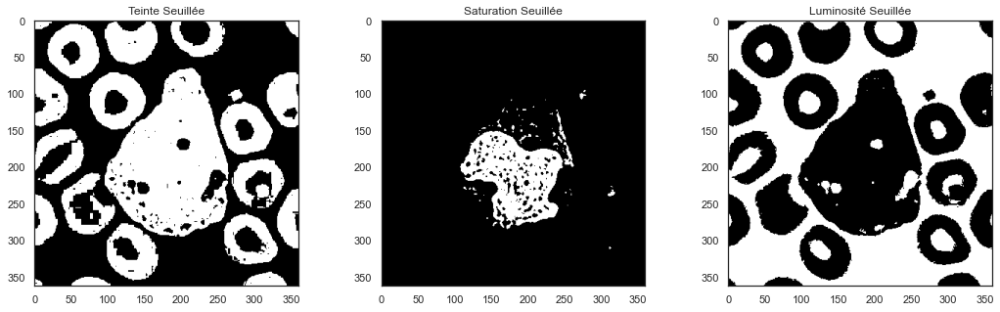

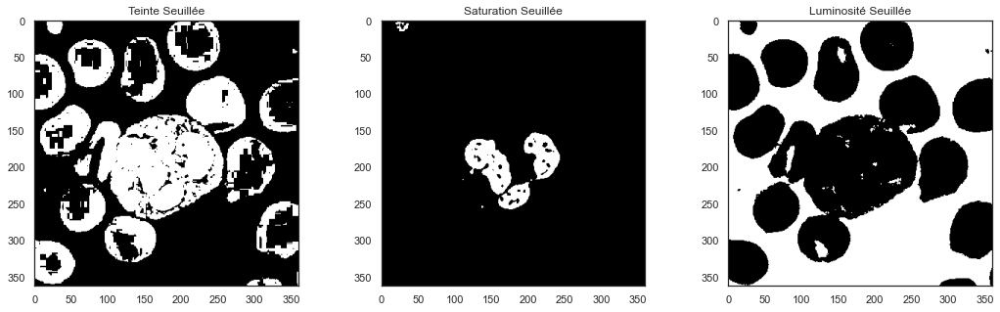

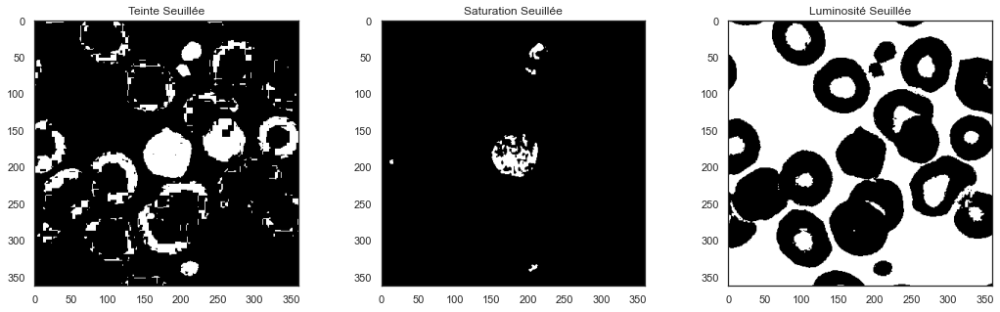

In [28]:
TH_h = []
TH_s = []
TH_v = []

for i in range(len(img_random)) :
    h,s,v= cv2.split(Hsv[i])
    ret_h, th_h = cv2.threshold(h,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    ret_s, th_s = cv2.threshold(s,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    ret_v, th_v = cv2.threshold(v,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    TH_h.append(th_h)
    TH_s.append(th_s)
    TH_v.append(th_v)

for j in range(len(img_random)) :
    _, axis = plt.subplots(ncols=3, figsize=(18, 5))
    axis[0].imshow(TH_h[j], 'gray')
    axis[0].set_title("Teinte Seuillée")
    axis[1].imshow(TH_s[j], 'gray')
    axis[1].set_title('Saturation Seuillée')
    axis[2].imshow(TH_v[j], 'gray')
    axis[2].set_title('Luminosité Seuillée');

# On constate que la saturation nous permet de segmenter les cellules

## 5.2. Seuillage d'OTSU sur les images LAB

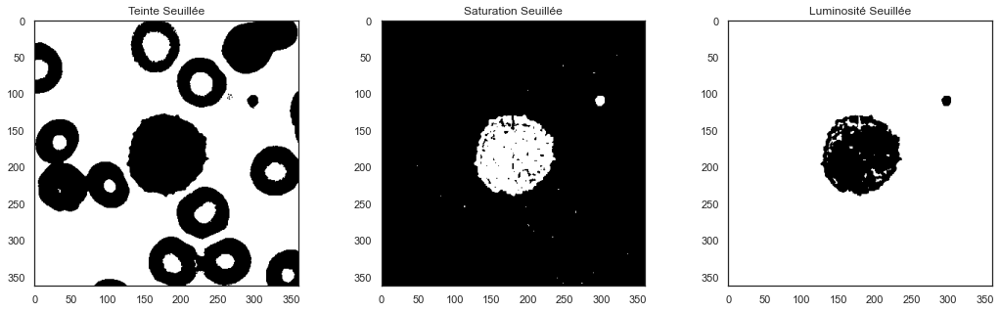

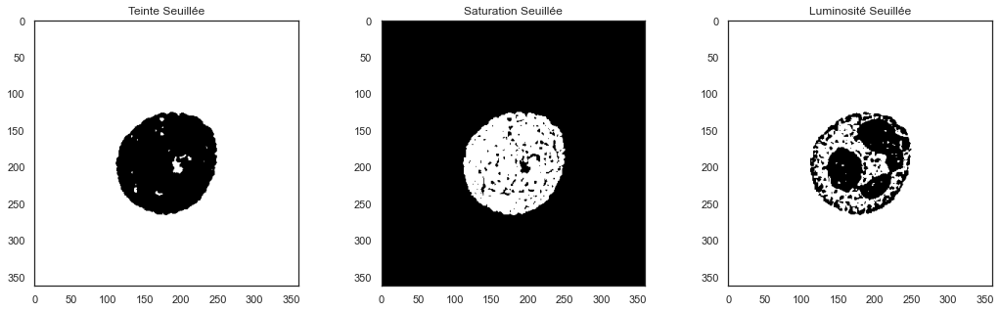

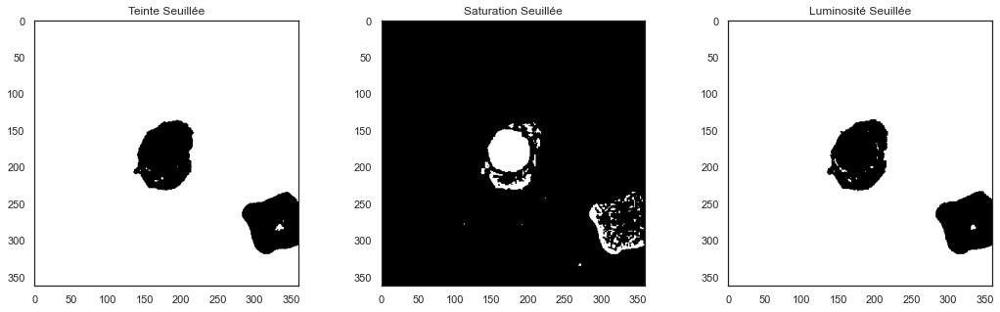

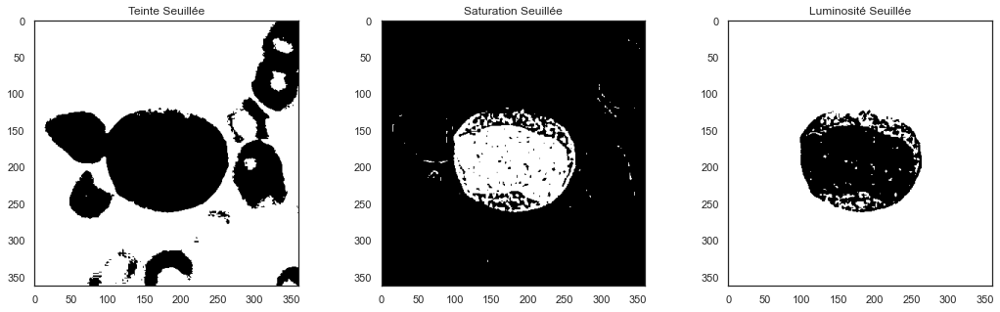

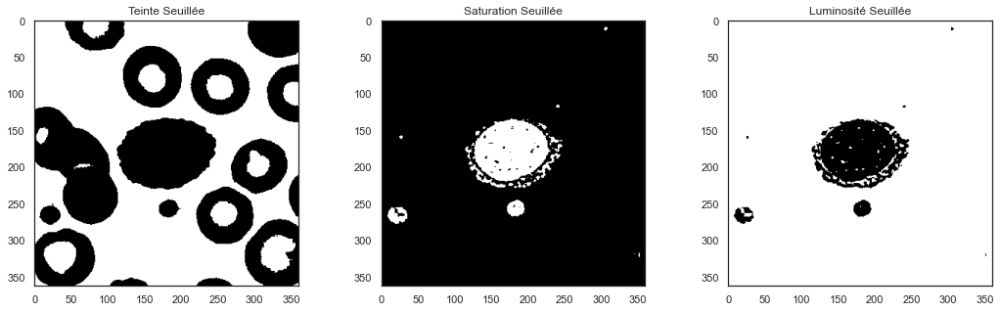

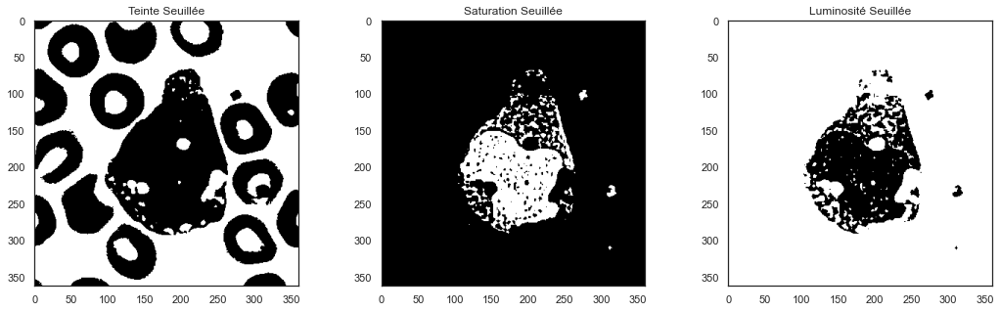

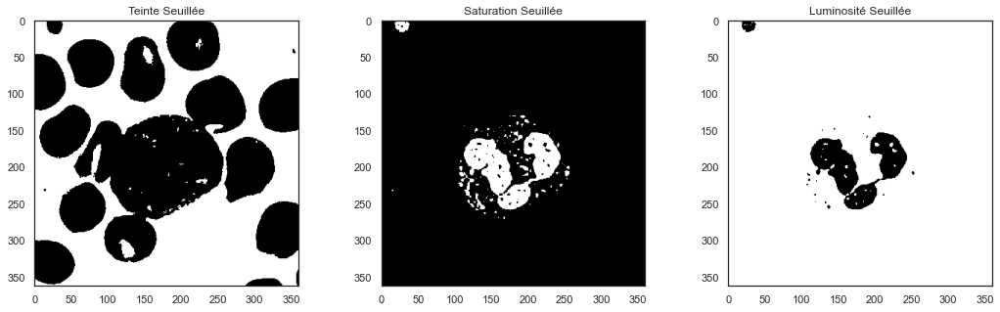

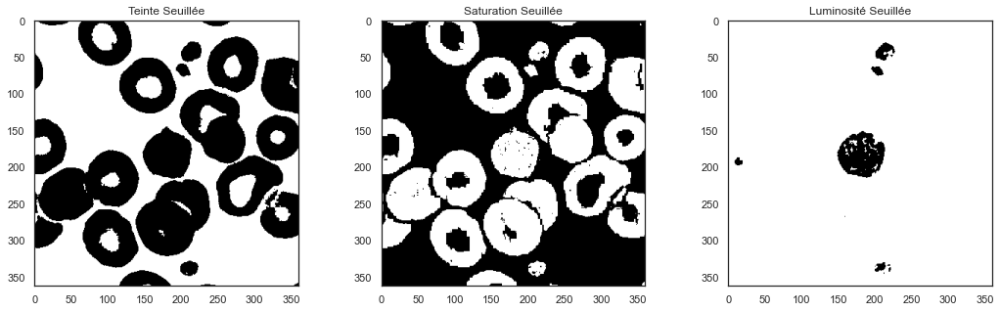

In [29]:
# créer des arrays vides, ensuite les remplire avec les images suiller 
TH_l = []
TH_a = []
TH_b = []

for i in range(len(img_random)) :
    l,a,b= cv2.split(Lab[i])
    ret_l, th_l = cv2.threshold(l,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    ret_a, th_a = cv2.threshold(a,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    ret_b, th_b = cv2.threshold(b,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    TH_l.append(th_l)
    TH_a.append(th_a)
    TH_b.append(th_b)

for j in range(len(img_random)) :
    _, axis = plt.subplots(ncols=3, figsize=(18, 5))
    axis[0].imshow(TH_l[j], 'gray')
    axis[0].set_title("Teinte Seuillée")
    axis[1].imshow(TH_a[j], 'gray')
    axis[1].set_title('Saturation Seuillée')
    axis[2].imshow(TH_b[j], 'gray')
    axis[2].set_title('Luminosité Seuillée');

> **CONCLUSION :** On constate que L et B segmentent bien les cellules

# 6. Segmentation en utilisant K-means et Mean Shift

## 6.1. K-Means clustering avec OpenCV

###  i. Images filtrées par couleur

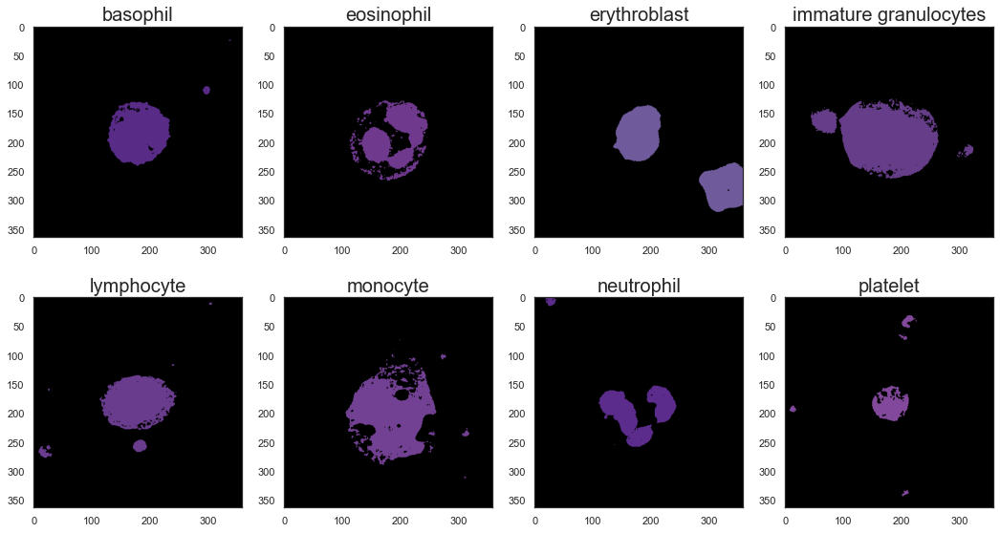

In [30]:
#############----------------- K-MEANS sur les images à qui on a nettoyé le background en amont-----------------############# 

Z = [] ## Créer une liste où stocker nos images redimentionner
Clustered_img = [] 

for i in range(len(img_random)) :
    img =filtered_image[i] # Img_cleaned
    
    # redimentionner l'image en un array à deux dimension (hauteur*lrgeur,coleur)
    z = img.reshape((-1,3))   
    
    # convertir de le type de l'array en 'float32' afin que les Kmeans de OpenCV le prenne en compte
    z = np.float32(z) 
    Z.append(z)
    # définir les critéres, nombre de clusters (K) et ensuite appliquer les K-Means
    criteria = (cv2.TermCriteria_EPS + cv2.TermCriteria_MAX_ITER, 10, 1.0)
    K = 2 # on met le nombre de clusters = 2 pour juste sortir les cellule
    
    # mettre les sorties de cv2.kmeans dans rets, labels, centroids
    rets , labels , centroids = cv2.kmeans(z, K, None, criteria, 10, cv2.KMEANS_PP_CENTERS)
 
    # revenir à la dimensions originale pour pouvoir afficher l'image
    centroids = np.uint8(centroids)
    res = centroids[labels.flatten()]
    res2 = res.reshape((img.shape))
    Clustered_img.append(res2)


noms_classe = ['basophil','eosinophil','erythroblast','immature granulocytes','lymphocyte','monocyte','neutrophil',
               'platelet']

fig= plt.figure(figsize=(18,20))   
for i in range(8):        
    # subplots
    plt.subplot(4, 4, i+1)   
    # Afficher l'image  
    plt.imshow(Clustered_img[i])
    # set the title to subplots
    plt.gca().set_title(noms_classe[i],size=20) ; 


### ii. Images HSV & LAB

In [31]:
img_random

['BA_65751.jpg',
 'EO_316132.jpg',
 'ERB_190644.jpg',
 'MY_628830.jpg',
 'LY_322720.jpg',
 'MO_68925.jpg',
 'SNE_48031.jpg',
 'PLATELET_45774.jpg']

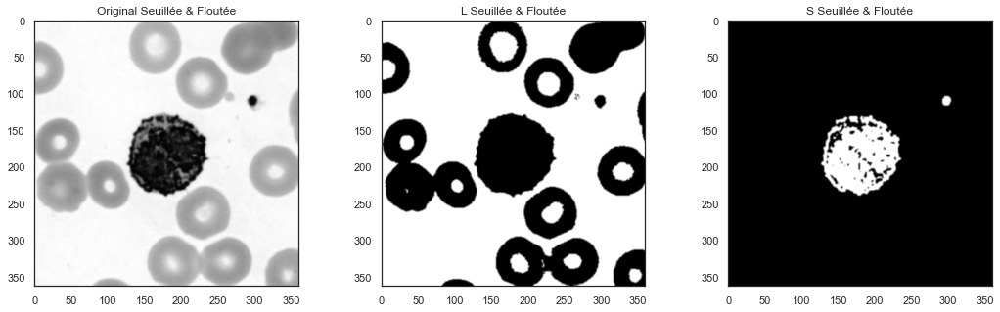

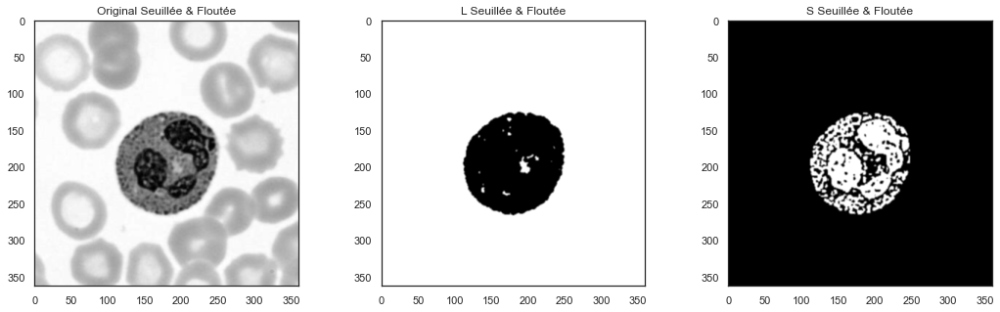

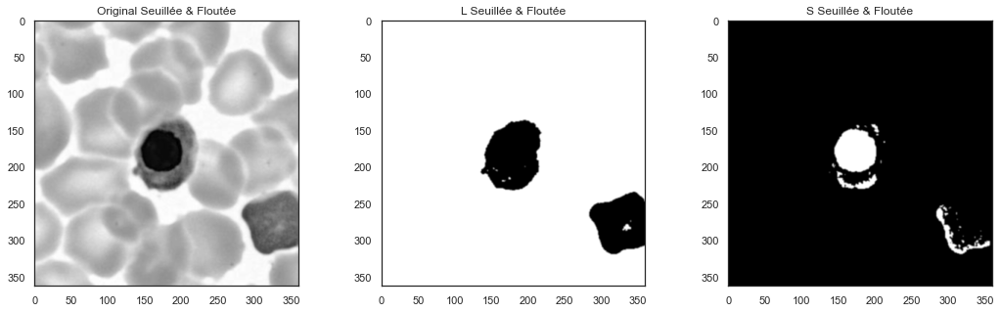

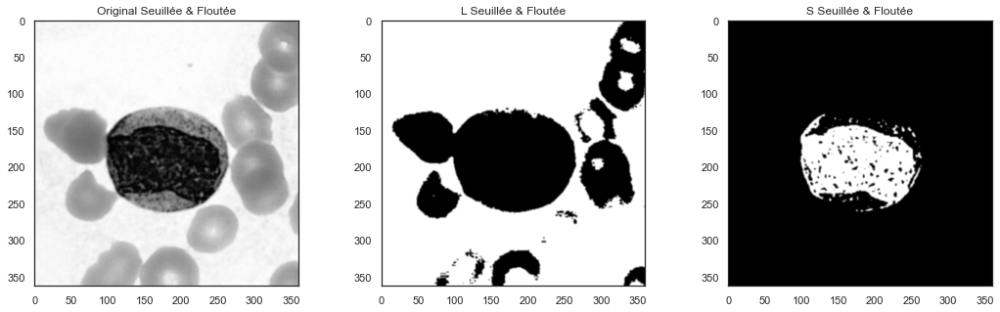

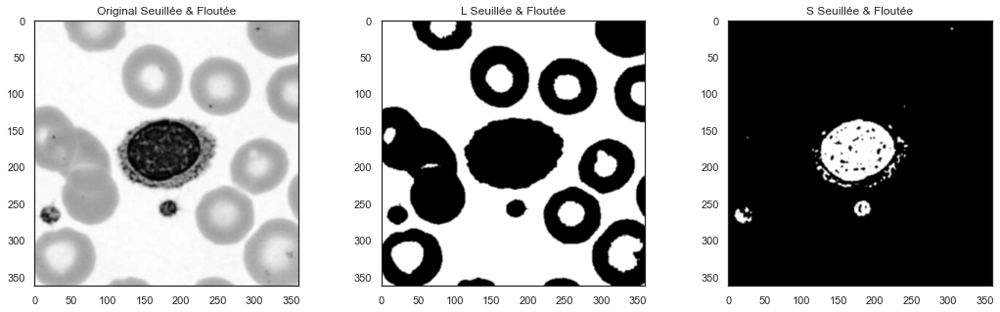

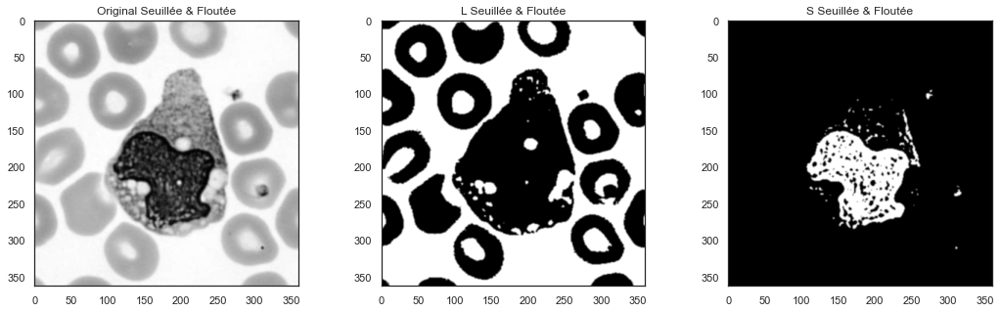

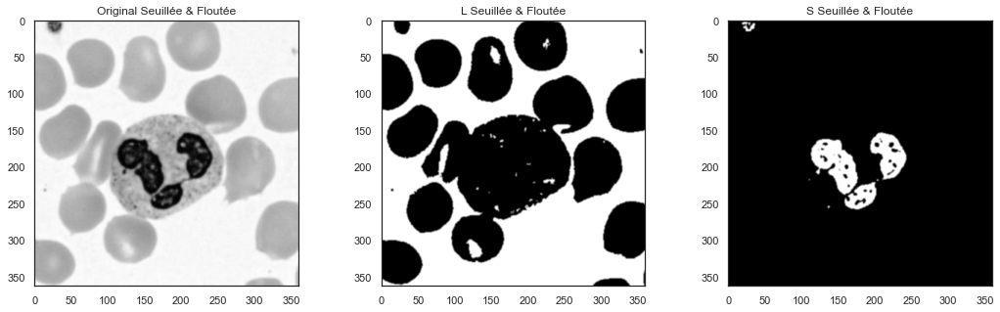

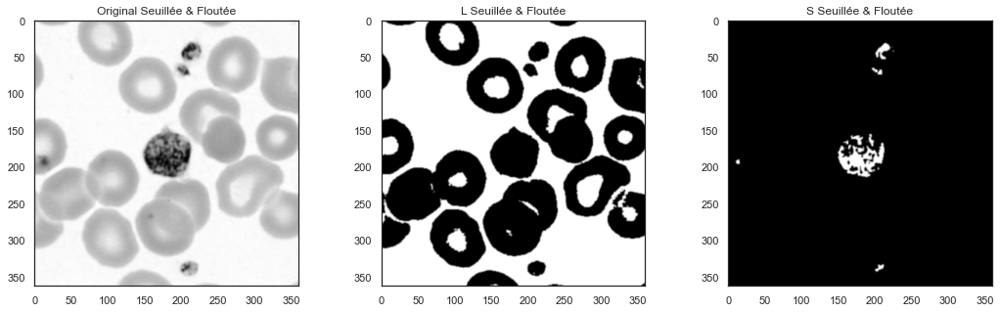

In [32]:
# faire un lissage gaussien à nos images
Img_blurred = []
TH_l_blurred = []
TH_s_blurred = []
for j in range(len(img_random)) :
    img= cv2.GaussianBlur(Img_gray[j], (3, 3), 0)
    Img_blurred.append(img)
    
    th_l_blurred = cv2.GaussianBlur(TH_l[j], (3,3),0)
    TH_l_blurred.append(th_l_blurred)
    
    th_s_blurred = cv2.GaussianBlur(TH_s[j], (3,3),0)
    TH_s_blurred.append(th_s_blurred)
    
for j in range(len(img_random)) :
    _, axis = plt.subplots(ncols=3, figsize=(18, 5))
    axis[0].imshow(Img_blurred[j], 'gray')
    axis[0].set_title("Original Seuillée & Floutée")
    axis[1].imshow(TH_l_blurred[j], 'gray')
    axis[1].set_title('L Seuillée & Floutée')
    axis[2].imshow(TH_s_blurred[j], 'gray')
    axis[2].set_title('S Seuillée & Floutée');


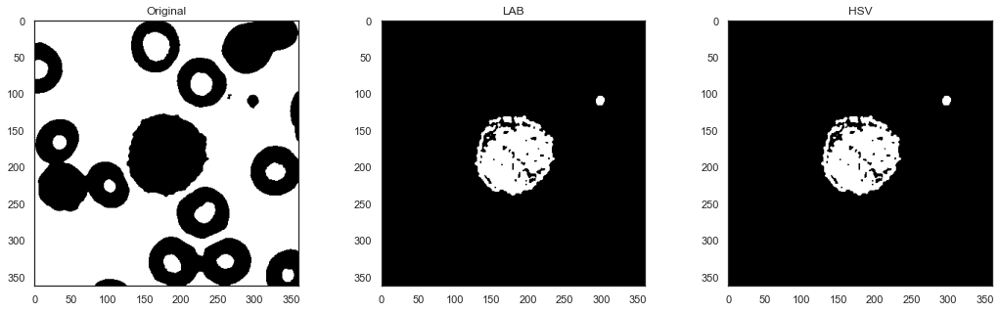

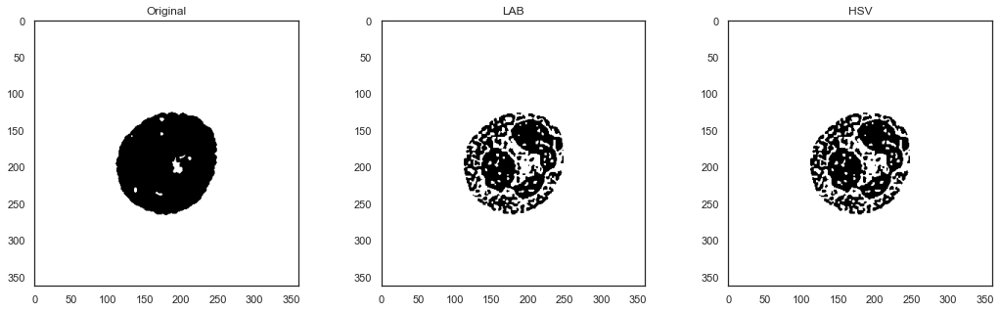

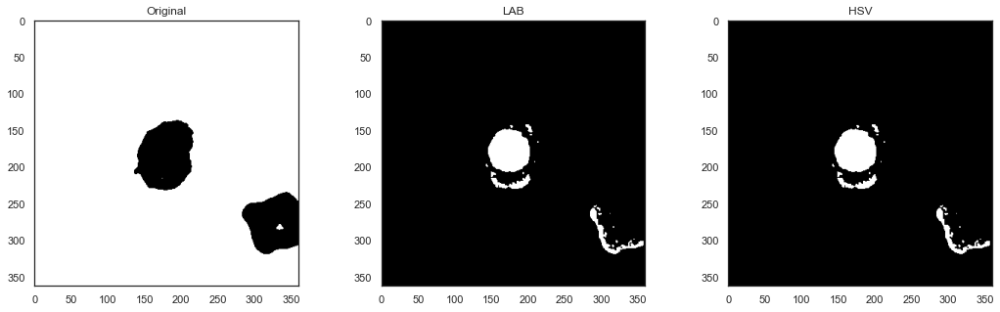

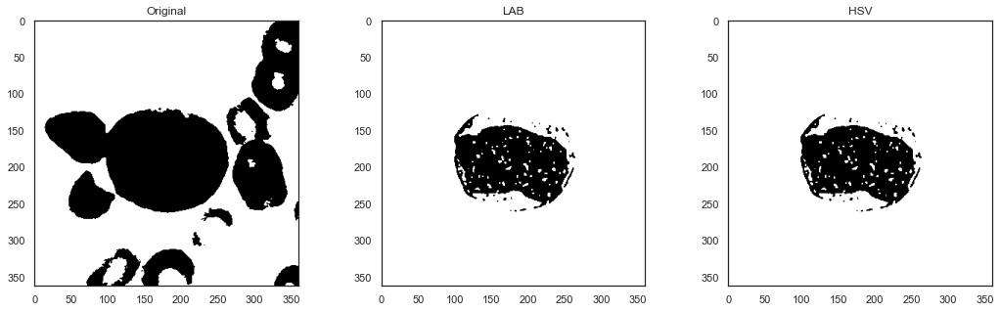

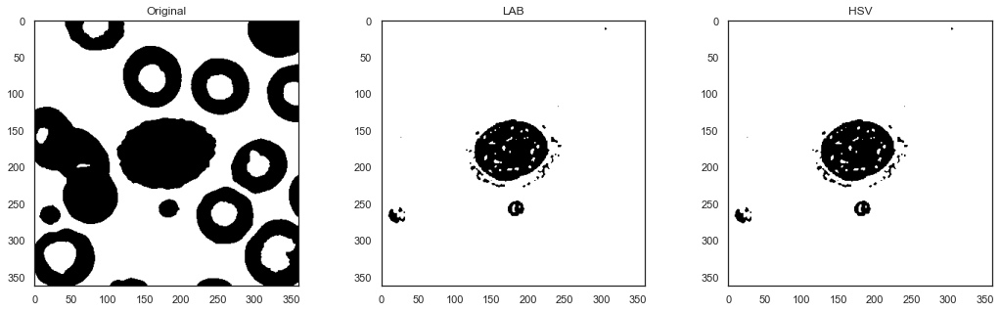

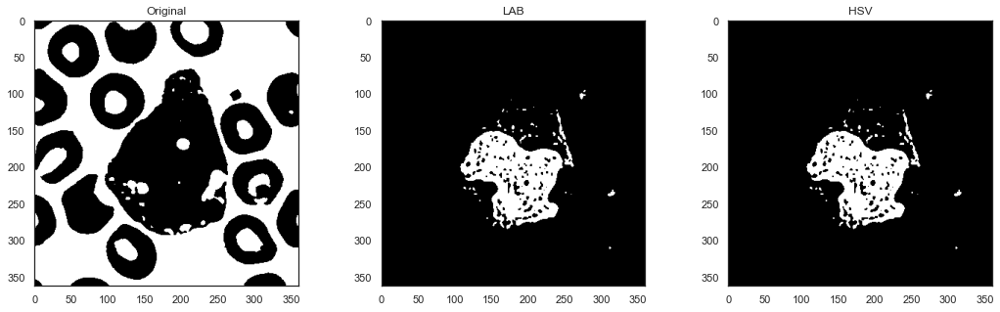

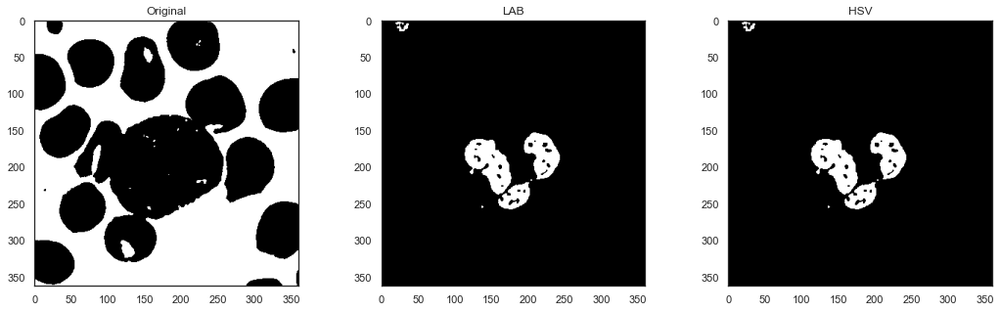

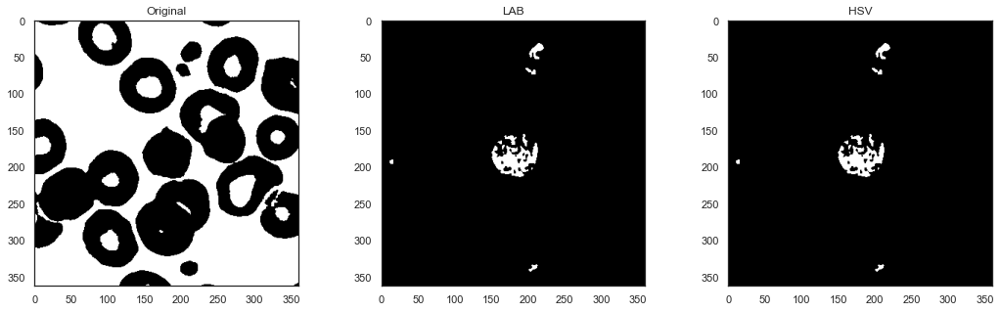

In [33]:
#############----------------- K-MEANS sur les images HSV et LAB-----------------############# 
# redimensionner les images
Img_blurred_rshpd = []
TH_s_blurred_rshpd = []
TH_l_blurred_rshpd = []

for j in range(len(img_random)) :
    Img_blurred_rshpd.append(Img_blurred[j].reshape(-1))
    TH_s_blurred_rshpd.append(TH_s_blurred[j].reshape(-1))
    TH_l_blurred_rshpd.append(TH_s_blurred[j].reshape(-1))

#Conversion des images de nparray en float
for j in range(len(img_random)) :
    Img_blurred_rshpd[j] = np.float32(Img_blurred_rshpd[j])
    TH_s_blurred_rshpd[j] = np.float32(TH_s_blurred_rshpd[j])
    TH_l_blurred_rshpd[j] = np.float32(TH_l_blurred_rshpd[j])

######-------------- Définition des paramètres --------------######
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 1.0)
K = 2
attempts=10

Clustered_image = []
Clustered_image_lab = []
Clustered_image_hsv = []

## Application des K-Means
for i in range(len(img_random)) :
    ret,label,center=cv2.kmeans(Img_blurred_rshpd[i],K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
    center = np.uint8(center)
    res = center[label.flatten()]
    result_image = res.reshape((Img_blurred[j].shape))
    Clustered_image.append(result_image)
    
    ret_l,label_l,center_l=cv2.kmeans(TH_l_blurred_rshpd[i],K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
    center_l = np.uint8(center_l)
    res_l = center[label_l.flatten()]
    result_image_lab = res_l.reshape((TH_l_blurred[i].shape))
    Clustered_image_lab.append(result_image_lab)
    
    ret_s,label_s,center_s=cv2.kmeans(TH_s_blurred_rshpd[i],K,None,criteria,attempts,cv2.KMEANS_PP_CENTERS)
    center_s = np.uint8(center_s)
    res_s = center[label_s.flatten()]
    result_image_hsv = res_s.reshape((TH_s_blurred[i].shape))
    Clustered_image_hsv.append(result_image_hsv)

for j in range(len(img_random)) :
    _, axis = plt.subplots(ncols=3, figsize=(18, 5))
    axis[0].imshow(Clustered_image[j], 'gray')
    axis[0].set_title("Original")
    axis[1].imshow(Clustered_image_lab[j], 'gray')
    axis[1].set_title('LAB')
    axis[2].imshow(Clustered_image_hsv[j], 'gray')
    axis[2].set_title('HSV');

# Graphique des centroïdes
#plt.scatter(center[:, 0],center[:, 1], marker = "o", color = "red",s=30, linewidths = 1, zorder = 10)
#plt.show()


### iii. Etude Kmeans pour extraction de la cellule cible

In [34]:
img_info = pd.read_csv('img_info.csv')
cell_types = pd.read_csv('cell_types.csv')
# cell_types = cell_types[cell_types.Source=='article'].drop(columns=['Source'])
df = pd.merge(img_info,cell_types,how='outer') # merge on column cell_subtype
print(len(df),len(img_info))

17092 17092


In [35]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

def KMeans_convert(img,n_clusters=6,bckgrd=True):
    """
    img : image in RGB
    n_clusters : nombre de clusters du Kmeans
    bckgrd : appliquer un filtre kmeans 2 sur le background ou non
    
    Description:
    Cette fonction applique un Kmeans pour K=6 qui regroupe les couleurs de l'image en 6 groupes, puis, parmi les centroïdes calculés, 
    on redéfinit 2 groupes de centroïdes en forçant le départ de l'algorithme à une couleur proche du fond et de la couleur des globules rouges.
    Parmi les 2 groupes de couleurs obtenus, le premier groupe correspondra donc au fond et aux globules rouges, que l'on fait apparaître en blanc.

    """
    
    start = time.time()                                                        # start timer
    h,w,c=img.shape                                                            # get image dimensions
    X=img.reshape(h*w,c)                                                       # reshape the image to an array (nb_pixels x canals)
    cluster=KMeans(n_clusters=n_clusters)                                      # KMeans instanciation
    cluster.fit(X)                                                             # KMeans training
    labels=cluster.labels_                                                     # Label for each pixel
    centroids = cluster.cluster_centers_                                       # K centroids
    
    if bckgrd==False:
        centroids_init = np.array([[252,227,199]                               # we force the algorithm to start with the label 0 centroid close to background color
                                   ,[69,24,130]])
        cluster2=KMeans(n_clusters=2,init=centroids_init,n_init=1).fit(centroids)                           # divide centroids in 2 clusters
        centroids[cluster2.labels_==0] = [255,255,255]                                # set up all centroids with label 0 to blank color
        # # centroids[cluster2.labels_==0] = cluster2.cluster_centers_[0]          # set up all centroids with label 0 to their centroid

    centroids = centroids.astype(int)
    X_recovered=centroids[labels]                                              # set-up each pixel to be equal to the centroid of its cluster
    img_recovered = X_recovered.reshape(h,w,c)                                 # reshape the array to the image initial dimensions
    end = time.time()                                                          # stop timer
    elapsed_time = end - start                                                 # elapsed time
    return img_recovered, elapsed_time, centroids


def ShowKmeansSample(df, sample_per_cell_type=1, n_clusters_range = [2,5,6,8,16]):
    
    nb_col = len(n_clusters_range)+1
    
    # index random selection:
    selected_index=[]
    for ct in df.cell_type_code.unique(): 
        new_selected_index=np.random.choice(
                           df[df.cell_type_code==ct].index                                         # parmis tous les indices du type de cellule
                           , size= sample_per_cell_type)                                           # on sélectionne un nombre sample_per_cell_type par type de cellule
        selected_index=np.concatenate([selected_index,new_selected_index]).astype(int)

    nb_images = len(selected_index)
    plt.figure(figsize = (nb_col*5, nb_images*5))
    
    for k,i in tqdm(enumerate(selected_index)):
        
        file = path_dataset + df.loc[i,'filename']
        img = cv2.imread(file,cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # conversion from BGR to RGB

        plt.subplot(nb_images,nb_col,nb_col*k+1)
        plt.imshow(img,cmap = 'gray')
        plt.xticks([]), plt.yticks([]), plt.title('Original\n'+df.loc[i,'cell_type'])

        # perf=[]
        img_pos = nb_col*k + 2
        for n_clusters in n_clusters_range:
            img_recovered, elapsed,_ = KMeans_convert(img,n_clusters=n_clusters,bckgrd=False)
            # perf.append(elapsed)
            # print(f'Temps d\'exécution K Means {k:0} : {elapsed:0.2} s')
            plt.subplot(nb_images,nb_col,img_pos)
            plt.imshow(img_recovered,cmap = 'gray')
            plt.xticks([]), plt.yticks([]), plt.title(f'K Means (K={n_clusters:0})\nExecution time :{elapsed:0.2} s')
            img_pos+=1 


16it [01:13,  4.58s/it]


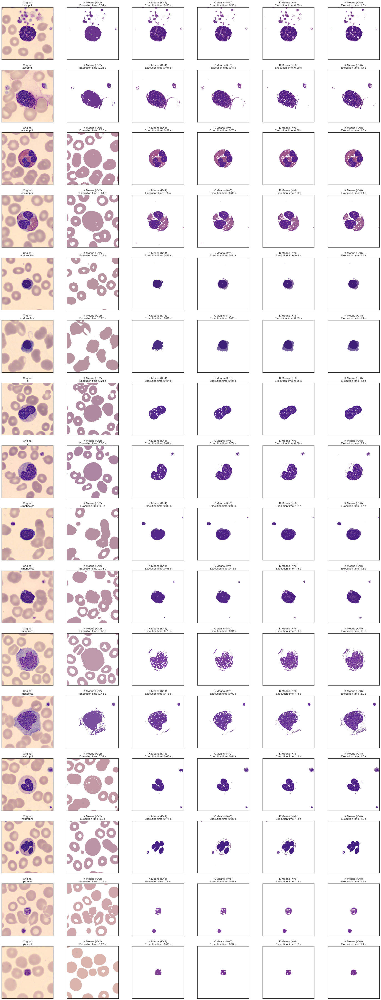

In [36]:
n_Kmeans_clusters = [2,4,5,6,8]
npc = 2
ShowKmeansSample(df,sample_per_cell_type=npc,n_clusters_range = n_Kmeans_clusters)
plt.savefig(path_analysis +'Analysis_Kmeans_'+str(npc*8)+'cells_'+str(n_Kmeans_clusters).replace(',','x').replace(' ','').replace('[','').replace(']','')+'.jpg')

> On choisit le Kmeans avec la meilleure nuance et un temps d'execution "raisonnable" : K = 6

### iv. K Means sur les coordonnées X,Y,R,G,B

In [37]:
##X Y R G B
# faire un traitement d'images en X Y R G B pour la partie K-means et visualiser les centroids

def KMeansXYRGB_convert(img,n_clusters=10):
    """  
    img : image in RGB
    
    Description:
    Cette fonction applique un Kmeans pour K=n_clusters qui regroupe les pixels par positions sur l'image et les 3 
    canaux de couleurs RGB A chaque pixel est appliqué ses coordonnées X, Y ainsi que ses intenistés lumineuses R,G,B.
    On soumet donc au Kmeans une matrice (363, 360, 5) où 5 représente le nombre de dimensions pour X,Y,R,G,B.
    
    """
    
    start = time.time()                        # start timer
    h,w,c=img.shape                            # get image dimensions
    XY = np.zeros([h,w,2])
    for x in range(h):                         # create matrix h,w,2 which gives X and Y coordinates of the pixel
        for y in range(w):
            XY[x,y] = [x,y]
    
    XY_img = np.concatenate([XY,img],axis=2)   # Concatenate the image with coordinates to create a matrix h,w,c+2 
                                               #                (c+2 = 5 coordinates X,Y,R,G,B)  
    
    X = XY_img.reshape(h*w,c+2)                # reshape the image to an array (nb_pixels x canals)
    cluster=KMeans(n_clusters=n_clusters)      # KMeans instanciation
    cluster.fit(X)                             # KMeans training
    labels=cluster.labels_                     # Label for each pixel
    centroids = cluster.cluster_centers_       # K centroids

    centroids = centroids.astype(int)
    X_recovered=centroids[labels]                   # set-up each pixel to be equal to the centroid of its cluster
    XY_img_recovered = X_recovered.reshape(h,w,c+2) # reshape the array to the XY_image dimensions
    img_recovered = XY_img_recovered[:,:,-3:]       # we get only RGB colors to reconstitute images
    end = time.time()                               # stop timer
    elapsed_time = end - start                      # elapsed time
    
    return img_recovered, elapsed_time, centroids


def Show_KmeansXYRGB_Sample(df, sample_per_cell_type=1, n_clusters_range = [10], show_centroids = True):
    
    nb_col = len(n_clusters_range)+1
    
    # index random selection:
    selected_index=[]
    for ct in df.cell_type_code.unique(): 
        new_selected_index=np.random.choice(
                           df[df.cell_type_code==ct].index      # parmis tous les indices du type de cellule on sélectionne
                           , size= sample_per_cell_type)        # un nombre sample_per_cell_type par type de cellule
        selected_index=np.concatenate([selected_index,new_selected_index]).astype(int)

    nb_images = len(selected_index)
    plt.figure(figsize = (nb_col*5, nb_images*5))
    
    for k,i in tqdm(enumerate(selected_index)):
        
        file = path_dataset + df.loc[i,'filename']
        # print(file)
        img = cv2.imread(file,cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # conversion from BGR to RGB

        plt.subplot(nb_images,nb_col,nb_col*k+1)
        plt.imshow(img,cmap = 'gray')
        plt.xticks([]), plt.yticks([]), plt.title('Original\n'+df.loc[i,'cell_type'])

        # perf=[]
        img_pos = nb_col*k + 2
        for n_clusters in n_clusters_range:
            img_recovered, elapsed, centroids = KMeansXYRGB_convert(img,n_clusters=n_clusters)
            # perf.append(elapsed)
            # print(f'Temps d\'exécution K Means {k:0} : {elapsed:0.2} s')
            
            plt.subplot(nb_images,nb_col,img_pos)
            plt.imshow(img_recovered,cmap = 'gray')
            if show_centroids:
                x_centroids = centroids[:,0]
                y_centroids = centroids[:,1]
                plt.scatter(x_centroids,y_centroids,color='red',marker = 'o', s= 30, alpha=0.8,edgecolor='red',linewidths=4)
            
            plt.xticks([]), plt.yticks([]), plt.title(f'K Means (K={n_clusters:0})\nExecution time :{elapsed:0.2} s')
            img_pos+=1 


8it [01:56, 14.61s/it]


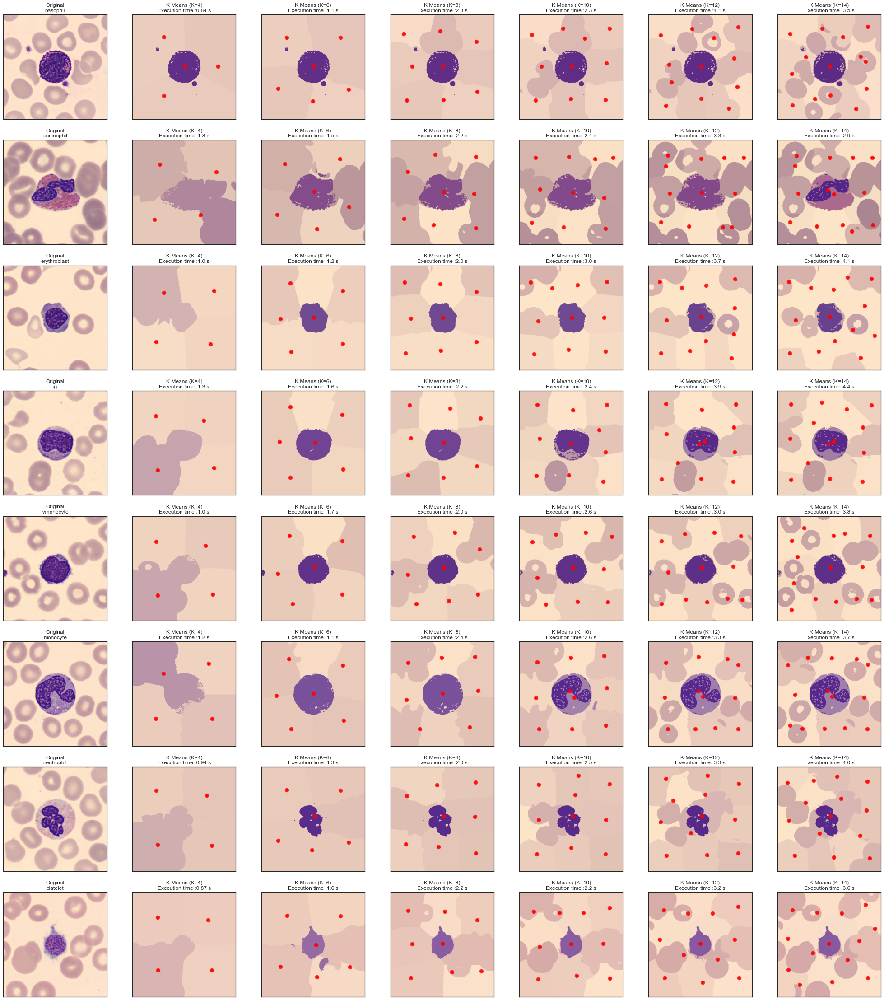

In [39]:
n_Kmeans_clusters = [4,6,8,10,12,14]
npc = 1
Show_KmeansXYRGB_Sample(df,sample_per_cell_type=npc,n_clusters_range = n_Kmeans_clusters, show_centroids = True)
plt.savefig(path_analysis +'Analysis_KmeansXYRGB_'+str(npc*8)+'cells_'+str(n_Kmeans_clusters).replace(',','x').\
                                        replace(' ','').replace('[','').replace(']','')+'.jpg')

> * Les résultats sont plutôt intéressants pour un K aux alentours de 10, malgré un temps d'execution important.
> * Un temps de préprocessing conséquent sera nécessaire.
> * étudions le meilleur paramètre K autour de 10, pour extraire un maximum de features.

8it [01:04,  8.08s/it]


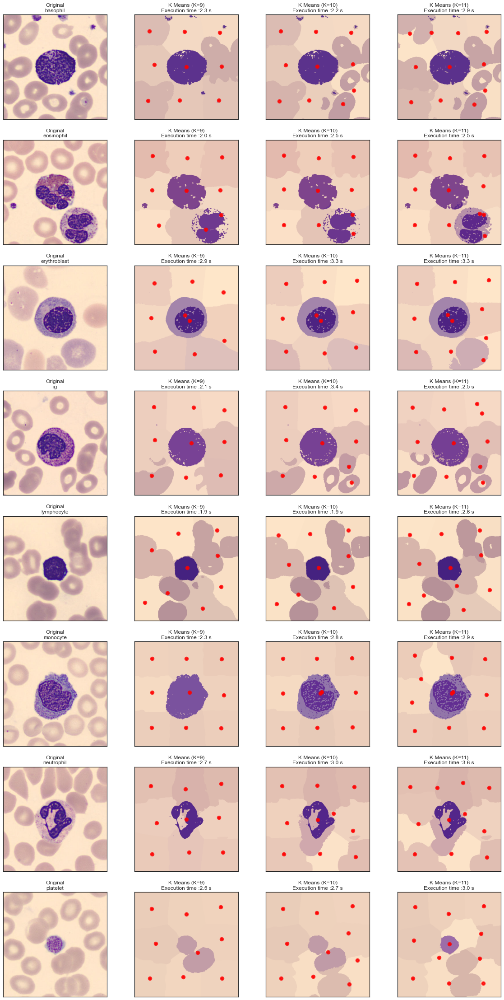

In [40]:
n_Kmeans_clusters = [9,10,11]
npc = 1
Show_KmeansXYRGB_Sample(df,sample_per_cell_type=npc,n_clusters_range = n_Kmeans_clusters, show_centroids = True)
plt.savefig(path_analysis +'Analysis_KmeansXYRGB_'+str(npc*8)+'cells_'+str(n_Kmeans_clusters).replace(',','x').\
                                                replace(' ','').replace('[','').replace(']','')+'.jpg')

> On gardera **K=10** qui est le nombre de clusters le plus faible permettant de conserver la nuance de dégradé de couleur à l'intérieur du cytoplasme de la cellule

## 6.2. Segmentation par Mean Shift

In [ ]:
figure = plt.figure(figsize=(18,18)) 
index_tmp = 1
#index_filtered_img= 0
for i in range(len(img_random)) :     # pour chaque index dans la liste
    img = cv2.resize(filtered_image[i],(360,360))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(4,4,index_tmp)
    plt.gca().set_title(noms_classe[i]+'- Base',size=20)
    plt.imshow(img, 'gray');
    index_tmp+=1
    
    # filtre de réduction du bruit
    img = cv2.medianBlur(img, 3)

    # aplatir l'image
    flat_image = img.reshape(img.shape[0]*img.shape[1], img.shape[2])

    # meanshift
    bandwidth = estimate_bandwidth(flat_image, quantile=0.5, n_samples=100)
    ms = MeanShift(bandwidth, max_iter=2000, bin_seeding=True)
    ms.fit(flat_image)
    labels=ms.labels_
    centroids = ms.cluster_centers_

    # Obtenir la couleur moyenne de chaque centroid
    total = np.zeros((centroids.shape[0], 3), dtype=float)
    count = np.zeros(total.shape, dtype=float)

    # Pour chaque label dans le tableau des labels
    for j, label in enumerate(labels):
        #On ajoute les valeurs RGB de chaque pixel de l'image applatit
        total[label] = total[label] + flat_image[j]
        count[label] += 1

    # On calcule la moyenne du RGB
    avg = total/count
    # On arrondi à l'entier
    avg = np.uint8(avg)

    # transposition de l'image étiquetée dans la couleur moyenne correspondante
    result = avg[labels]
    result = result.reshape((img.shape))

    #Affichage du resultat
    plt.subplot(4,4,index_tmp)
    plt.gca().set_title(noms_classe[i] + ' - MS - k' + str(centroids.shape[0]))
    plt.imshow(result, 'gray');
    index_tmp+=1
    
plt.savefig(path_analysis +'Analysis_MeanShift.jpg')